# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

  inflating: processed_celeba_small/celeba/162210.jpg  
  inflating: processed_celeba_small/celeba/162211.jpg  
  inflating: processed_celeba_small/celeba/162212.jpg  
  inflating: processed_celeba_small/celeba/162213.jpg  
  inflating: processed_celeba_small/celeba/162214.jpg  
  inflating: processed_celeba_small/celeba/162215.jpg  
  inflating: processed_celeba_small/celeba/162216.jpg  
  inflating: processed_celeba_small/celeba/162217.jpg  
  inflating: processed_celeba_small/celeba/162218.jpg  
  inflating: processed_celeba_small/celeba/162219.jpg  
  inflating: processed_celeba_small/celeba/162220.jpg  
  inflating: processed_celeba_small/celeba/162221.jpg  
  inflating: processed_celeba_small/celeba/162222.jpg  
  inflating: processed_celeba_small/celeba/162223.jpg  
  inflating: processed_celeba_small/celeba/162224.jpg  
  inflating: processed_celeba_small/celeba/162225.jpg  
  inflating: processed_celeba_small/celeba/162226.jpg  
  inflating: processed_celeba_small/celeba/16222

  inflating: processed_celeba_small/celeba/162577.jpg  
  inflating: processed_celeba_small/celeba/162578.jpg  
  inflating: processed_celeba_small/celeba/162579.jpg  
  inflating: processed_celeba_small/celeba/162580.jpg  
  inflating: processed_celeba_small/celeba/162581.jpg  
  inflating: processed_celeba_small/celeba/162582.jpg  
  inflating: processed_celeba_small/celeba/162583.jpg  
  inflating: processed_celeba_small/celeba/162584.jpg  
  inflating: processed_celeba_small/celeba/162585.jpg  
  inflating: processed_celeba_small/celeba/162586.jpg  
  inflating: processed_celeba_small/celeba/162587.jpg  
  inflating: processed_celeba_small/celeba/162588.jpg  
  inflating: processed_celeba_small/celeba/162589.jpg  
  inflating: processed_celeba_small/celeba/162590.jpg  
  inflating: processed_celeba_small/celeba/162591.jpg  
  inflating: processed_celeba_small/celeba/162592.jpg  
  inflating: processed_celeba_small/celeba/162593.jpg  
  inflating: processed_celeba_small/celeba/16259

  inflating: processed_celeba_small/celeba/162927.jpg  
  inflating: processed_celeba_small/celeba/162928.jpg  
  inflating: processed_celeba_small/celeba/162929.jpg  
  inflating: processed_celeba_small/celeba/162930.jpg  
  inflating: processed_celeba_small/celeba/162931.jpg  
  inflating: processed_celeba_small/celeba/162932.jpg  
  inflating: processed_celeba_small/celeba/162933.jpg  
  inflating: processed_celeba_small/celeba/162934.jpg  
  inflating: processed_celeba_small/celeba/162935.jpg  
  inflating: processed_celeba_small/celeba/162936.jpg  
  inflating: processed_celeba_small/celeba/162937.jpg  
  inflating: processed_celeba_small/celeba/162938.jpg  
  inflating: processed_celeba_small/celeba/162939.jpg  
  inflating: processed_celeba_small/celeba/162940.jpg  
  inflating: processed_celeba_small/celeba/162941.jpg  
  inflating: processed_celeba_small/celeba/162942.jpg  
  inflating: processed_celeba_small/celeba/162943.jpg  
  inflating: processed_celeba_small/celeba/16294

  inflating: processed_celeba_small/celeba/163315.jpg  
  inflating: processed_celeba_small/celeba/163316.jpg  
  inflating: processed_celeba_small/celeba/163317.jpg  
  inflating: processed_celeba_small/celeba/163318.jpg  
  inflating: processed_celeba_small/celeba/163319.jpg  
  inflating: processed_celeba_small/celeba/163320.jpg  
  inflating: processed_celeba_small/celeba/163321.jpg  
  inflating: processed_celeba_small/celeba/163322.jpg  
  inflating: processed_celeba_small/celeba/163323.jpg  
  inflating: processed_celeba_small/celeba/163324.jpg  
  inflating: processed_celeba_small/celeba/163325.jpg  
  inflating: processed_celeba_small/celeba/163326.jpg  
  inflating: processed_celeba_small/celeba/163327.jpg  
  inflating: processed_celeba_small/celeba/163328.jpg  
  inflating: processed_celeba_small/celeba/163329.jpg  
  inflating: processed_celeba_small/celeba/163330.jpg  
  inflating: processed_celeba_small/celeba/163331.jpg  
  inflating: processed_celeba_small/celeba/16333

  inflating: processed_celeba_small/celeba/163727.jpg  
  inflating: processed_celeba_small/celeba/163728.jpg  
  inflating: processed_celeba_small/celeba/163729.jpg  
  inflating: processed_celeba_small/celeba/163730.jpg  
  inflating: processed_celeba_small/celeba/163731.jpg  
  inflating: processed_celeba_small/celeba/163732.jpg  
  inflating: processed_celeba_small/celeba/163733.jpg  
  inflating: processed_celeba_small/celeba/163734.jpg  
  inflating: processed_celeba_small/celeba/163735.jpg  
  inflating: processed_celeba_small/celeba/163736.jpg  
  inflating: processed_celeba_small/celeba/163737.jpg  
  inflating: processed_celeba_small/celeba/163738.jpg  
  inflating: processed_celeba_small/celeba/163739.jpg  
  inflating: processed_celeba_small/celeba/163740.jpg  
  inflating: processed_celeba_small/celeba/163741.jpg  
  inflating: processed_celeba_small/celeba/163742.jpg  
  inflating: processed_celeba_small/celeba/163743.jpg  
  inflating: processed_celeba_small/celeba/16374

  inflating: processed_celeba_small/celeba/164137.jpg  
  inflating: processed_celeba_small/celeba/164138.jpg  
  inflating: processed_celeba_small/celeba/164139.jpg  
  inflating: processed_celeba_small/celeba/164140.jpg  
  inflating: processed_celeba_small/celeba/164141.jpg  
  inflating: processed_celeba_small/celeba/164142.jpg  
  inflating: processed_celeba_small/celeba/164143.jpg  
  inflating: processed_celeba_small/celeba/164144.jpg  
  inflating: processed_celeba_small/celeba/164145.jpg  
  inflating: processed_celeba_small/celeba/164146.jpg  
  inflating: processed_celeba_small/celeba/164147.jpg  
  inflating: processed_celeba_small/celeba/164148.jpg  
  inflating: processed_celeba_small/celeba/164149.jpg  
  inflating: processed_celeba_small/celeba/164150.jpg  
  inflating: processed_celeba_small/celeba/164151.jpg  
  inflating: processed_celeba_small/celeba/164152.jpg  
  inflating: processed_celeba_small/celeba/164153.jpg  
  inflating: processed_celeba_small/celeba/16415

  inflating: processed_celeba_small/celeba/164555.jpg  
  inflating: processed_celeba_small/celeba/164556.jpg  
  inflating: processed_celeba_small/celeba/164557.jpg  
  inflating: processed_celeba_small/celeba/164558.jpg  
  inflating: processed_celeba_small/celeba/164559.jpg  
  inflating: processed_celeba_small/celeba/164560.jpg  
  inflating: processed_celeba_small/celeba/164561.jpg  
  inflating: processed_celeba_small/celeba/164562.jpg  
  inflating: processed_celeba_small/celeba/164563.jpg  
  inflating: processed_celeba_small/celeba/164564.jpg  
  inflating: processed_celeba_small/celeba/164565.jpg  
  inflating: processed_celeba_small/celeba/164566.jpg  
  inflating: processed_celeba_small/celeba/164567.jpg  
  inflating: processed_celeba_small/celeba/164568.jpg  
  inflating: processed_celeba_small/celeba/164569.jpg  
  inflating: processed_celeba_small/celeba/164570.jpg  
  inflating: processed_celeba_small/celeba/164571.jpg  
  inflating: processed_celeba_small/celeba/16457

  inflating: processed_celeba_small/celeba/164942.jpg  
  inflating: processed_celeba_small/celeba/164943.jpg  
  inflating: processed_celeba_small/celeba/164944.jpg  
  inflating: processed_celeba_small/celeba/164945.jpg  
  inflating: processed_celeba_small/celeba/164946.jpg  
  inflating: processed_celeba_small/celeba/164947.jpg  
  inflating: processed_celeba_small/celeba/164948.jpg  
  inflating: processed_celeba_small/celeba/164949.jpg  
  inflating: processed_celeba_small/celeba/164950.jpg  
  inflating: processed_celeba_small/celeba/164951.jpg  
  inflating: processed_celeba_small/celeba/164952.jpg  
  inflating: processed_celeba_small/celeba/164953.jpg  
  inflating: processed_celeba_small/celeba/164954.jpg  
  inflating: processed_celeba_small/celeba/164955.jpg  
  inflating: processed_celeba_small/celeba/164956.jpg  
  inflating: processed_celeba_small/celeba/164957.jpg  
  inflating: processed_celeba_small/celeba/164958.jpg  
  inflating: processed_celeba_small/celeba/16495

  inflating: processed_celeba_small/celeba/165348.jpg  
  inflating: processed_celeba_small/celeba/165349.jpg  
  inflating: processed_celeba_small/celeba/165350.jpg  
  inflating: processed_celeba_small/celeba/165351.jpg  
  inflating: processed_celeba_small/celeba/165352.jpg  
  inflating: processed_celeba_small/celeba/165353.jpg  
  inflating: processed_celeba_small/celeba/165354.jpg  
  inflating: processed_celeba_small/celeba/165355.jpg  
  inflating: processed_celeba_small/celeba/165356.jpg  
  inflating: processed_celeba_small/celeba/165357.jpg  
  inflating: processed_celeba_small/celeba/165358.jpg  
  inflating: processed_celeba_small/celeba/165359.jpg  
  inflating: processed_celeba_small/celeba/165360.jpg  
  inflating: processed_celeba_small/celeba/165361.jpg  
  inflating: processed_celeba_small/celeba/165362.jpg  
  inflating: processed_celeba_small/celeba/165363.jpg  
  inflating: processed_celeba_small/celeba/165364.jpg  
  inflating: processed_celeba_small/celeba/16536

  inflating: processed_celeba_small/celeba/165744.jpg  
  inflating: processed_celeba_small/celeba/165745.jpg  
  inflating: processed_celeba_small/celeba/165746.jpg  
  inflating: processed_celeba_small/celeba/165747.jpg  
  inflating: processed_celeba_small/celeba/165748.jpg  
  inflating: processed_celeba_small/celeba/165749.jpg  
  inflating: processed_celeba_small/celeba/165750.jpg  
  inflating: processed_celeba_small/celeba/165751.jpg  
  inflating: processed_celeba_small/celeba/165752.jpg  
  inflating: processed_celeba_small/celeba/165753.jpg  
  inflating: processed_celeba_small/celeba/165754.jpg  
  inflating: processed_celeba_small/celeba/165755.jpg  
  inflating: processed_celeba_small/celeba/165756.jpg  
  inflating: processed_celeba_small/celeba/165757.jpg  
  inflating: processed_celeba_small/celeba/165758.jpg  
  inflating: processed_celeba_small/celeba/165759.jpg  
  inflating: processed_celeba_small/celeba/165760.jpg  
  inflating: processed_celeba_small/celeba/16576

  inflating: processed_celeba_small/celeba/166152.jpg  
  inflating: processed_celeba_small/celeba/166153.jpg  
  inflating: processed_celeba_small/celeba/166154.jpg  
  inflating: processed_celeba_small/celeba/166155.jpg  
  inflating: processed_celeba_small/celeba/166156.jpg  
  inflating: processed_celeba_small/celeba/166157.jpg  
  inflating: processed_celeba_small/celeba/166158.jpg  
  inflating: processed_celeba_small/celeba/166159.jpg  
  inflating: processed_celeba_small/celeba/166160.jpg  
  inflating: processed_celeba_small/celeba/166161.jpg  
  inflating: processed_celeba_small/celeba/166162.jpg  
  inflating: processed_celeba_small/celeba/166163.jpg  
  inflating: processed_celeba_small/celeba/166164.jpg  
  inflating: processed_celeba_small/celeba/166165.jpg  
  inflating: processed_celeba_small/celeba/166166.jpg  
  inflating: processed_celeba_small/celeba/166167.jpg  
  inflating: processed_celeba_small/celeba/166168.jpg  
  inflating: processed_celeba_small/celeba/16616

  inflating: processed_celeba_small/celeba/166552.jpg  
  inflating: processed_celeba_small/celeba/166553.jpg  
  inflating: processed_celeba_small/celeba/166554.jpg  
  inflating: processed_celeba_small/celeba/166555.jpg  
  inflating: processed_celeba_small/celeba/166556.jpg  
  inflating: processed_celeba_small/celeba/166557.jpg  
  inflating: processed_celeba_small/celeba/166558.jpg  
  inflating: processed_celeba_small/celeba/166559.jpg  
  inflating: processed_celeba_small/celeba/166560.jpg  
  inflating: processed_celeba_small/celeba/166561.jpg  
  inflating: processed_celeba_small/celeba/166562.jpg  
  inflating: processed_celeba_small/celeba/166563.jpg  
  inflating: processed_celeba_small/celeba/166564.jpg  
  inflating: processed_celeba_small/celeba/166565.jpg  
  inflating: processed_celeba_small/celeba/166566.jpg  
  inflating: processed_celeba_small/celeba/166567.jpg  
  inflating: processed_celeba_small/celeba/166568.jpg  
  inflating: processed_celeba_small/celeba/16656

  inflating: processed_celeba_small/celeba/166946.jpg  
  inflating: processed_celeba_small/celeba/166947.jpg  
  inflating: processed_celeba_small/celeba/166948.jpg  
  inflating: processed_celeba_small/celeba/166949.jpg  
  inflating: processed_celeba_small/celeba/166950.jpg  
  inflating: processed_celeba_small/celeba/166951.jpg  
  inflating: processed_celeba_small/celeba/166952.jpg  
  inflating: processed_celeba_small/celeba/166953.jpg  
  inflating: processed_celeba_small/celeba/166954.jpg  
  inflating: processed_celeba_small/celeba/166955.jpg  
  inflating: processed_celeba_small/celeba/166956.jpg  
  inflating: processed_celeba_small/celeba/166957.jpg  
  inflating: processed_celeba_small/celeba/166958.jpg  
  inflating: processed_celeba_small/celeba/166959.jpg  
  inflating: processed_celeba_small/celeba/166960.jpg  
  inflating: processed_celeba_small/celeba/166961.jpg  
  inflating: processed_celeba_small/celeba/166962.jpg  
  inflating: processed_celeba_small/celeba/16696

  inflating: processed_celeba_small/celeba/167310.jpg  
  inflating: processed_celeba_small/celeba/167311.jpg  
  inflating: processed_celeba_small/celeba/167312.jpg  
  inflating: processed_celeba_small/celeba/167313.jpg  
  inflating: processed_celeba_small/celeba/167314.jpg  
  inflating: processed_celeba_small/celeba/167315.jpg  
  inflating: processed_celeba_small/celeba/167316.jpg  
  inflating: processed_celeba_small/celeba/167317.jpg  
  inflating: processed_celeba_small/celeba/167318.jpg  
  inflating: processed_celeba_small/celeba/167319.jpg  
  inflating: processed_celeba_small/celeba/167320.jpg  
  inflating: processed_celeba_small/celeba/167321.jpg  
  inflating: processed_celeba_small/celeba/167322.jpg  
  inflating: processed_celeba_small/celeba/167323.jpg  
  inflating: processed_celeba_small/celeba/167324.jpg  
  inflating: processed_celeba_small/celeba/167325.jpg  
  inflating: processed_celeba_small/celeba/167326.jpg  
  inflating: processed_celeba_small/celeba/16732

  inflating: processed_celeba_small/celeba/167686.jpg  
  inflating: processed_celeba_small/celeba/167687.jpg  
  inflating: processed_celeba_small/celeba/167688.jpg  
  inflating: processed_celeba_small/celeba/167689.jpg  
  inflating: processed_celeba_small/celeba/167690.jpg  
  inflating: processed_celeba_small/celeba/167691.jpg  
  inflating: processed_celeba_small/celeba/167692.jpg  
  inflating: processed_celeba_small/celeba/167693.jpg  
  inflating: processed_celeba_small/celeba/167694.jpg  
  inflating: processed_celeba_small/celeba/167695.jpg  
  inflating: processed_celeba_small/celeba/167696.jpg  
  inflating: processed_celeba_small/celeba/167697.jpg  
  inflating: processed_celeba_small/celeba/167698.jpg  
  inflating: processed_celeba_small/celeba/167699.jpg  
  inflating: processed_celeba_small/celeba/167700.jpg  
  inflating: processed_celeba_small/celeba/167701.jpg  
  inflating: processed_celeba_small/celeba/167702.jpg  
  inflating: processed_celeba_small/celeba/16770

  inflating: processed_celeba_small/celeba/168103.jpg  
  inflating: processed_celeba_small/celeba/168104.jpg  
  inflating: processed_celeba_small/celeba/168105.jpg  
  inflating: processed_celeba_small/celeba/168106.jpg  
  inflating: processed_celeba_small/celeba/168107.jpg  
  inflating: processed_celeba_small/celeba/168108.jpg  
  inflating: processed_celeba_small/celeba/168109.jpg  
  inflating: processed_celeba_small/celeba/168110.jpg  
  inflating: processed_celeba_small/celeba/168111.jpg  
  inflating: processed_celeba_small/celeba/168112.jpg  
  inflating: processed_celeba_small/celeba/168113.jpg  
  inflating: processed_celeba_small/celeba/168114.jpg  
  inflating: processed_celeba_small/celeba/168115.jpg  
  inflating: processed_celeba_small/celeba/168116.jpg  
  inflating: processed_celeba_small/celeba/168117.jpg  
  inflating: processed_celeba_small/celeba/168118.jpg  
  inflating: processed_celeba_small/celeba/168119.jpg  
  inflating: processed_celeba_small/celeba/16812

  inflating: processed_celeba_small/celeba/168503.jpg  
  inflating: processed_celeba_small/celeba/168504.jpg  
  inflating: processed_celeba_small/celeba/168505.jpg  
  inflating: processed_celeba_small/celeba/168506.jpg  
  inflating: processed_celeba_small/celeba/168507.jpg  
  inflating: processed_celeba_small/celeba/168508.jpg  
  inflating: processed_celeba_small/celeba/168509.jpg  
  inflating: processed_celeba_small/celeba/168510.jpg  
  inflating: processed_celeba_small/celeba/168511.jpg  
  inflating: processed_celeba_small/celeba/168512.jpg  
  inflating: processed_celeba_small/celeba/168513.jpg  
  inflating: processed_celeba_small/celeba/168514.jpg  
  inflating: processed_celeba_small/celeba/168515.jpg  
  inflating: processed_celeba_small/celeba/168516.jpg  
  inflating: processed_celeba_small/celeba/168517.jpg  
  inflating: processed_celeba_small/celeba/168518.jpg  
  inflating: processed_celeba_small/celeba/168519.jpg  
  inflating: processed_celeba_small/celeba/16852

  inflating: processed_celeba_small/celeba/168910.jpg  
  inflating: processed_celeba_small/celeba/168911.jpg  
  inflating: processed_celeba_small/celeba/168912.jpg  
  inflating: processed_celeba_small/celeba/168913.jpg  
  inflating: processed_celeba_small/celeba/168914.jpg  
  inflating: processed_celeba_small/celeba/168915.jpg  
  inflating: processed_celeba_small/celeba/168916.jpg  
  inflating: processed_celeba_small/celeba/168917.jpg  
  inflating: processed_celeba_small/celeba/168918.jpg  
  inflating: processed_celeba_small/celeba/168919.jpg  
  inflating: processed_celeba_small/celeba/168920.jpg  
  inflating: processed_celeba_small/celeba/168921.jpg  
  inflating: processed_celeba_small/celeba/168922.jpg  
  inflating: processed_celeba_small/celeba/168923.jpg  
  inflating: processed_celeba_small/celeba/168924.jpg  
  inflating: processed_celeba_small/celeba/168925.jpg  
  inflating: processed_celeba_small/celeba/168926.jpg  
  inflating: processed_celeba_small/celeba/16892

  inflating: processed_celeba_small/celeba/169305.jpg  
  inflating: processed_celeba_small/celeba/169306.jpg  
  inflating: processed_celeba_small/celeba/169307.jpg  
  inflating: processed_celeba_small/celeba/169308.jpg  
  inflating: processed_celeba_small/celeba/169309.jpg  
  inflating: processed_celeba_small/celeba/169310.jpg  
  inflating: processed_celeba_small/celeba/169311.jpg  
  inflating: processed_celeba_small/celeba/169312.jpg  
  inflating: processed_celeba_small/celeba/169313.jpg  
  inflating: processed_celeba_small/celeba/169314.jpg  
  inflating: processed_celeba_small/celeba/169315.jpg  
  inflating: processed_celeba_small/celeba/169316.jpg  
  inflating: processed_celeba_small/celeba/169317.jpg  
  inflating: processed_celeba_small/celeba/169318.jpg  
  inflating: processed_celeba_small/celeba/169319.jpg  
  inflating: processed_celeba_small/celeba/169320.jpg  
  inflating: processed_celeba_small/celeba/169321.jpg  
  inflating: processed_celeba_small/celeba/16932

  inflating: processed_celeba_small/celeba/169681.jpg  
  inflating: processed_celeba_small/celeba/169682.jpg  
  inflating: processed_celeba_small/celeba/169683.jpg  
  inflating: processed_celeba_small/celeba/169684.jpg  
  inflating: processed_celeba_small/celeba/169685.jpg  
  inflating: processed_celeba_small/celeba/169686.jpg  
  inflating: processed_celeba_small/celeba/169687.jpg  
  inflating: processed_celeba_small/celeba/169688.jpg  
  inflating: processed_celeba_small/celeba/169689.jpg  
  inflating: processed_celeba_small/celeba/169690.jpg  
  inflating: processed_celeba_small/celeba/169691.jpg  
  inflating: processed_celeba_small/celeba/169692.jpg  
  inflating: processed_celeba_small/celeba/169693.jpg  
  inflating: processed_celeba_small/celeba/169694.jpg  
  inflating: processed_celeba_small/celeba/169695.jpg  
  inflating: processed_celeba_small/celeba/169696.jpg  
  inflating: processed_celeba_small/celeba/169697.jpg  
  inflating: processed_celeba_small/celeba/16969

  inflating: processed_celeba_small/celeba/170081.jpg  
  inflating: processed_celeba_small/celeba/170082.jpg  
  inflating: processed_celeba_small/celeba/170083.jpg  
  inflating: processed_celeba_small/celeba/170084.jpg  
  inflating: processed_celeba_small/celeba/170085.jpg  
  inflating: processed_celeba_small/celeba/170086.jpg  
  inflating: processed_celeba_small/celeba/170087.jpg  
  inflating: processed_celeba_small/celeba/170088.jpg  
  inflating: processed_celeba_small/celeba/170089.jpg  
  inflating: processed_celeba_small/celeba/170090.jpg  
  inflating: processed_celeba_small/celeba/170091.jpg  
  inflating: processed_celeba_small/celeba/170092.jpg  
  inflating: processed_celeba_small/celeba/170093.jpg  
  inflating: processed_celeba_small/celeba/170094.jpg  
  inflating: processed_celeba_small/celeba/170095.jpg  
  inflating: processed_celeba_small/celeba/170096.jpg  
  inflating: processed_celeba_small/celeba/170097.jpg  
  inflating: processed_celeba_small/celeba/17009

  inflating: processed_celeba_small/celeba/170414.jpg  
  inflating: processed_celeba_small/celeba/170415.jpg  
  inflating: processed_celeba_small/celeba/170416.jpg  
  inflating: processed_celeba_small/celeba/170417.jpg  
  inflating: processed_celeba_small/celeba/170418.jpg  
  inflating: processed_celeba_small/celeba/170419.jpg  
  inflating: processed_celeba_small/celeba/170420.jpg  
  inflating: processed_celeba_small/celeba/170421.jpg  
  inflating: processed_celeba_small/celeba/170422.jpg  
  inflating: processed_celeba_small/celeba/170423.jpg  
  inflating: processed_celeba_small/celeba/170424.jpg  
  inflating: processed_celeba_small/celeba/170425.jpg  
  inflating: processed_celeba_small/celeba/170426.jpg  
  inflating: processed_celeba_small/celeba/170427.jpg  
  inflating: processed_celeba_small/celeba/170428.jpg  
  inflating: processed_celeba_small/celeba/170429.jpg  
  inflating: processed_celeba_small/celeba/170430.jpg  
  inflating: processed_celeba_small/celeba/17043

  inflating: processed_celeba_small/celeba/170766.jpg  
  inflating: processed_celeba_small/celeba/170767.jpg  
  inflating: processed_celeba_small/celeba/170768.jpg  
  inflating: processed_celeba_small/celeba/170769.jpg  
  inflating: processed_celeba_small/celeba/170770.jpg  
  inflating: processed_celeba_small/celeba/170771.jpg  
  inflating: processed_celeba_small/celeba/170772.jpg  
  inflating: processed_celeba_small/celeba/170773.jpg  
  inflating: processed_celeba_small/celeba/170774.jpg  
  inflating: processed_celeba_small/celeba/170775.jpg  
  inflating: processed_celeba_small/celeba/170776.jpg  
  inflating: processed_celeba_small/celeba/170777.jpg  
  inflating: processed_celeba_small/celeba/170778.jpg  
  inflating: processed_celeba_small/celeba/170779.jpg  
  inflating: processed_celeba_small/celeba/170780.jpg  
  inflating: processed_celeba_small/celeba/170781.jpg  
  inflating: processed_celeba_small/celeba/170782.jpg  
  inflating: processed_celeba_small/celeba/17078

  inflating: processed_celeba_small/celeba/171120.jpg  
  inflating: processed_celeba_small/celeba/171121.jpg  
  inflating: processed_celeba_small/celeba/171122.jpg  
  inflating: processed_celeba_small/celeba/171123.jpg  
  inflating: processed_celeba_small/celeba/171124.jpg  
  inflating: processed_celeba_small/celeba/171125.jpg  
  inflating: processed_celeba_small/celeba/171126.jpg  
  inflating: processed_celeba_small/celeba/171127.jpg  
  inflating: processed_celeba_small/celeba/171128.jpg  
  inflating: processed_celeba_small/celeba/171129.jpg  
  inflating: processed_celeba_small/celeba/171130.jpg  
  inflating: processed_celeba_small/celeba/171131.jpg  
  inflating: processed_celeba_small/celeba/171132.jpg  
  inflating: processed_celeba_small/celeba/171133.jpg  
  inflating: processed_celeba_small/celeba/171134.jpg  
  inflating: processed_celeba_small/celeba/171135.jpg  
  inflating: processed_celeba_small/celeba/171136.jpg  
  inflating: processed_celeba_small/celeba/17113

  inflating: processed_celeba_small/celeba/171518.jpg  
  inflating: processed_celeba_small/celeba/171519.jpg  
  inflating: processed_celeba_small/celeba/171520.jpg  
  inflating: processed_celeba_small/celeba/171521.jpg  
  inflating: processed_celeba_small/celeba/171522.jpg  
  inflating: processed_celeba_small/celeba/171523.jpg  
  inflating: processed_celeba_small/celeba/171524.jpg  
  inflating: processed_celeba_small/celeba/171525.jpg  
  inflating: processed_celeba_small/celeba/171526.jpg  
  inflating: processed_celeba_small/celeba/171527.jpg  
  inflating: processed_celeba_small/celeba/171528.jpg  
  inflating: processed_celeba_small/celeba/171529.jpg  
  inflating: processed_celeba_small/celeba/171530.jpg  
  inflating: processed_celeba_small/celeba/171531.jpg  
  inflating: processed_celeba_small/celeba/171532.jpg  
  inflating: processed_celeba_small/celeba/171533.jpg  
  inflating: processed_celeba_small/celeba/171534.jpg  
  inflating: processed_celeba_small/celeba/17153

  inflating: processed_celeba_small/celeba/171912.jpg  
  inflating: processed_celeba_small/celeba/171913.jpg  
  inflating: processed_celeba_small/celeba/171914.jpg  
  inflating: processed_celeba_small/celeba/171915.jpg  
  inflating: processed_celeba_small/celeba/171916.jpg  
  inflating: processed_celeba_small/celeba/171917.jpg  
  inflating: processed_celeba_small/celeba/171918.jpg  
  inflating: processed_celeba_small/celeba/171919.jpg  
  inflating: processed_celeba_small/celeba/171920.jpg  
  inflating: processed_celeba_small/celeba/171921.jpg  
  inflating: processed_celeba_small/celeba/171922.jpg  
  inflating: processed_celeba_small/celeba/171923.jpg  
  inflating: processed_celeba_small/celeba/171924.jpg  
  inflating: processed_celeba_small/celeba/171925.jpg  
  inflating: processed_celeba_small/celeba/171926.jpg  
  inflating: processed_celeba_small/celeba/171927.jpg  
  inflating: processed_celeba_small/celeba/171928.jpg  
  inflating: processed_celeba_small/celeba/17192

  inflating: processed_celeba_small/celeba/172319.jpg  
  inflating: processed_celeba_small/celeba/172320.jpg  
  inflating: processed_celeba_small/celeba/172321.jpg  
  inflating: processed_celeba_small/celeba/172322.jpg  
  inflating: processed_celeba_small/celeba/172323.jpg  
  inflating: processed_celeba_small/celeba/172324.jpg  
  inflating: processed_celeba_small/celeba/172325.jpg  
  inflating: processed_celeba_small/celeba/172326.jpg  
  inflating: processed_celeba_small/celeba/172327.jpg  
  inflating: processed_celeba_small/celeba/172328.jpg  
  inflating: processed_celeba_small/celeba/172329.jpg  
  inflating: processed_celeba_small/celeba/172330.jpg  
  inflating: processed_celeba_small/celeba/172331.jpg  
  inflating: processed_celeba_small/celeba/172332.jpg  
  inflating: processed_celeba_small/celeba/172333.jpg  
  inflating: processed_celeba_small/celeba/172334.jpg  
  inflating: processed_celeba_small/celeba/172335.jpg  
  inflating: processed_celeba_small/celeba/17233

  inflating: processed_celeba_small/celeba/172733.jpg  
  inflating: processed_celeba_small/celeba/172734.jpg  
  inflating: processed_celeba_small/celeba/172735.jpg  
  inflating: processed_celeba_small/celeba/172736.jpg  
  inflating: processed_celeba_small/celeba/172737.jpg  
  inflating: processed_celeba_small/celeba/172738.jpg  
  inflating: processed_celeba_small/celeba/172739.jpg  
  inflating: processed_celeba_small/celeba/172740.jpg  
  inflating: processed_celeba_small/celeba/172741.jpg  
  inflating: processed_celeba_small/celeba/172742.jpg  
  inflating: processed_celeba_small/celeba/172743.jpg  
  inflating: processed_celeba_small/celeba/172744.jpg  
  inflating: processed_celeba_small/celeba/172745.jpg  
  inflating: processed_celeba_small/celeba/172746.jpg  
  inflating: processed_celeba_small/celeba/172747.jpg  
  inflating: processed_celeba_small/celeba/172748.jpg  
  inflating: processed_celeba_small/celeba/172749.jpg  
  inflating: processed_celeba_small/celeba/17275

  inflating: processed_celeba_small/celeba/173149.jpg  
  inflating: processed_celeba_small/celeba/173150.jpg  
  inflating: processed_celeba_small/celeba/173151.jpg  
  inflating: processed_celeba_small/celeba/173152.jpg  
  inflating: processed_celeba_small/celeba/173153.jpg  
  inflating: processed_celeba_small/celeba/173154.jpg  
  inflating: processed_celeba_small/celeba/173155.jpg  
  inflating: processed_celeba_small/celeba/173156.jpg  
  inflating: processed_celeba_small/celeba/173157.jpg  
  inflating: processed_celeba_small/celeba/173158.jpg  
  inflating: processed_celeba_small/celeba/173159.jpg  
  inflating: processed_celeba_small/celeba/173160.jpg  
  inflating: processed_celeba_small/celeba/173161.jpg  
  inflating: processed_celeba_small/celeba/173162.jpg  
  inflating: processed_celeba_small/celeba/173163.jpg  
  inflating: processed_celeba_small/celeba/173164.jpg  
  inflating: processed_celeba_small/celeba/173165.jpg  
  inflating: processed_celeba_small/celeba/17316

  inflating: processed_celeba_small/celeba/173545.jpg  
  inflating: processed_celeba_small/celeba/173546.jpg  
  inflating: processed_celeba_small/celeba/173547.jpg  
  inflating: processed_celeba_small/celeba/173548.jpg  
  inflating: processed_celeba_small/celeba/173549.jpg  
  inflating: processed_celeba_small/celeba/173550.jpg  
  inflating: processed_celeba_small/celeba/173551.jpg  
  inflating: processed_celeba_small/celeba/173552.jpg  
  inflating: processed_celeba_small/celeba/173553.jpg  
  inflating: processed_celeba_small/celeba/173554.jpg  
  inflating: processed_celeba_small/celeba/173555.jpg  
  inflating: processed_celeba_small/celeba/173556.jpg  
  inflating: processed_celeba_small/celeba/173557.jpg  
  inflating: processed_celeba_small/celeba/173558.jpg  
  inflating: processed_celeba_small/celeba/173559.jpg  
  inflating: processed_celeba_small/celeba/173560.jpg  
  inflating: processed_celeba_small/celeba/173561.jpg  
  inflating: processed_celeba_small/celeba/17356

  inflating: processed_celeba_small/celeba/173928.jpg  
  inflating: processed_celeba_small/celeba/173929.jpg  
  inflating: processed_celeba_small/celeba/173930.jpg  
  inflating: processed_celeba_small/celeba/173931.jpg  
  inflating: processed_celeba_small/celeba/173932.jpg  
  inflating: processed_celeba_small/celeba/173933.jpg  
  inflating: processed_celeba_small/celeba/173934.jpg  
  inflating: processed_celeba_small/celeba/173935.jpg  
  inflating: processed_celeba_small/celeba/173936.jpg  
  inflating: processed_celeba_small/celeba/173937.jpg  
  inflating: processed_celeba_small/celeba/173938.jpg  
  inflating: processed_celeba_small/celeba/173939.jpg  
  inflating: processed_celeba_small/celeba/173940.jpg  
  inflating: processed_celeba_small/celeba/173941.jpg  
  inflating: processed_celeba_small/celeba/173942.jpg  
  inflating: processed_celeba_small/celeba/173943.jpg  
  inflating: processed_celeba_small/celeba/173944.jpg  
  inflating: processed_celeba_small/celeba/17394

  inflating: processed_celeba_small/celeba/174324.jpg  
  inflating: processed_celeba_small/celeba/174325.jpg  
  inflating: processed_celeba_small/celeba/174326.jpg  
  inflating: processed_celeba_small/celeba/174327.jpg  
  inflating: processed_celeba_small/celeba/174328.jpg  
  inflating: processed_celeba_small/celeba/174329.jpg  
  inflating: processed_celeba_small/celeba/174330.jpg  
  inflating: processed_celeba_small/celeba/174331.jpg  
  inflating: processed_celeba_small/celeba/174332.jpg  
  inflating: processed_celeba_small/celeba/174333.jpg  
  inflating: processed_celeba_small/celeba/174334.jpg  
  inflating: processed_celeba_small/celeba/174335.jpg  
  inflating: processed_celeba_small/celeba/174336.jpg  
  inflating: processed_celeba_small/celeba/174337.jpg  
  inflating: processed_celeba_small/celeba/174338.jpg  
  inflating: processed_celeba_small/celeba/174339.jpg  
  inflating: processed_celeba_small/celeba/174340.jpg  
  inflating: processed_celeba_small/celeba/17434

  inflating: processed_celeba_small/celeba/174711.jpg  
  inflating: processed_celeba_small/celeba/174712.jpg  
  inflating: processed_celeba_small/celeba/174713.jpg  
  inflating: processed_celeba_small/celeba/174714.jpg  
  inflating: processed_celeba_small/celeba/174715.jpg  
  inflating: processed_celeba_small/celeba/174716.jpg  
  inflating: processed_celeba_small/celeba/174717.jpg  
  inflating: processed_celeba_small/celeba/174718.jpg  
  inflating: processed_celeba_small/celeba/174719.jpg  
  inflating: processed_celeba_small/celeba/174720.jpg  
  inflating: processed_celeba_small/celeba/174721.jpg  
  inflating: processed_celeba_small/celeba/174722.jpg  
  inflating: processed_celeba_small/celeba/174723.jpg  
  inflating: processed_celeba_small/celeba/174724.jpg  
  inflating: processed_celeba_small/celeba/174725.jpg  
  inflating: processed_celeba_small/celeba/174726.jpg  
  inflating: processed_celeba_small/celeba/174727.jpg  
  inflating: processed_celeba_small/celeba/17472

  inflating: processed_celeba_small/celeba/175130.jpg  
  inflating: processed_celeba_small/celeba/175131.jpg  
  inflating: processed_celeba_small/celeba/175132.jpg  
  inflating: processed_celeba_small/celeba/175133.jpg  
  inflating: processed_celeba_small/celeba/175134.jpg  
  inflating: processed_celeba_small/celeba/175135.jpg  
  inflating: processed_celeba_small/celeba/175136.jpg  
  inflating: processed_celeba_small/celeba/175137.jpg  
  inflating: processed_celeba_small/celeba/175138.jpg  
  inflating: processed_celeba_small/celeba/175139.jpg  
  inflating: processed_celeba_small/celeba/175140.jpg  
  inflating: processed_celeba_small/celeba/175141.jpg  
  inflating: processed_celeba_small/celeba/175142.jpg  
  inflating: processed_celeba_small/celeba/175143.jpg  
  inflating: processed_celeba_small/celeba/175144.jpg  
  inflating: processed_celeba_small/celeba/175145.jpg  
  inflating: processed_celeba_small/celeba/175146.jpg  
  inflating: processed_celeba_small/celeba/17514

  inflating: processed_celeba_small/celeba/175546.jpg  
  inflating: processed_celeba_small/celeba/175547.jpg  
  inflating: processed_celeba_small/celeba/175548.jpg  
  inflating: processed_celeba_small/celeba/175549.jpg  
  inflating: processed_celeba_small/celeba/175550.jpg  
  inflating: processed_celeba_small/celeba/175551.jpg  
  inflating: processed_celeba_small/celeba/175552.jpg  
  inflating: processed_celeba_small/celeba/175553.jpg  
  inflating: processed_celeba_small/celeba/175554.jpg  
  inflating: processed_celeba_small/celeba/175555.jpg  
  inflating: processed_celeba_small/celeba/175556.jpg  
  inflating: processed_celeba_small/celeba/175557.jpg  
  inflating: processed_celeba_small/celeba/175558.jpg  
  inflating: processed_celeba_small/celeba/175559.jpg  
  inflating: processed_celeba_small/celeba/175560.jpg  
  inflating: processed_celeba_small/celeba/175561.jpg  
  inflating: processed_celeba_small/celeba/175562.jpg  
  inflating: processed_celeba_small/celeba/17556

  inflating: processed_celeba_small/celeba/175940.jpg  
  inflating: processed_celeba_small/celeba/175941.jpg  
  inflating: processed_celeba_small/celeba/175942.jpg  
  inflating: processed_celeba_small/celeba/175943.jpg  
  inflating: processed_celeba_small/celeba/175944.jpg  
  inflating: processed_celeba_small/celeba/175945.jpg  
  inflating: processed_celeba_small/celeba/175946.jpg  
  inflating: processed_celeba_small/celeba/175947.jpg  
  inflating: processed_celeba_small/celeba/175948.jpg  
  inflating: processed_celeba_small/celeba/175949.jpg  
  inflating: processed_celeba_small/celeba/175950.jpg  
  inflating: processed_celeba_small/celeba/175951.jpg  
  inflating: processed_celeba_small/celeba/175952.jpg  
  inflating: processed_celeba_small/celeba/175953.jpg  
  inflating: processed_celeba_small/celeba/175954.jpg  
  inflating: processed_celeba_small/celeba/175955.jpg  
  inflating: processed_celeba_small/celeba/175956.jpg  
  inflating: processed_celeba_small/celeba/17595

  inflating: processed_celeba_small/celeba/176337.jpg  
  inflating: processed_celeba_small/celeba/176338.jpg  
  inflating: processed_celeba_small/celeba/176339.jpg  
  inflating: processed_celeba_small/celeba/176340.jpg  
  inflating: processed_celeba_small/celeba/176341.jpg  
  inflating: processed_celeba_small/celeba/176342.jpg  
  inflating: processed_celeba_small/celeba/176343.jpg  
  inflating: processed_celeba_small/celeba/176344.jpg  
  inflating: processed_celeba_small/celeba/176345.jpg  
  inflating: processed_celeba_small/celeba/176346.jpg  
  inflating: processed_celeba_small/celeba/176347.jpg  
  inflating: processed_celeba_small/celeba/176348.jpg  
  inflating: processed_celeba_small/celeba/176349.jpg  
  inflating: processed_celeba_small/celeba/176350.jpg  
  inflating: processed_celeba_small/celeba/176351.jpg  
  inflating: processed_celeba_small/celeba/176352.jpg  
  inflating: processed_celeba_small/celeba/176353.jpg  
  inflating: processed_celeba_small/celeba/17635

  inflating: processed_celeba_small/celeba/176753.jpg  
  inflating: processed_celeba_small/celeba/176754.jpg  
  inflating: processed_celeba_small/celeba/176755.jpg  
  inflating: processed_celeba_small/celeba/176756.jpg  
  inflating: processed_celeba_small/celeba/176757.jpg  
  inflating: processed_celeba_small/celeba/176758.jpg  
  inflating: processed_celeba_small/celeba/176759.jpg  
  inflating: processed_celeba_small/celeba/176760.jpg  
  inflating: processed_celeba_small/celeba/176761.jpg  
  inflating: processed_celeba_small/celeba/176762.jpg  
  inflating: processed_celeba_small/celeba/176763.jpg  
  inflating: processed_celeba_small/celeba/176764.jpg  
  inflating: processed_celeba_small/celeba/176765.jpg  
  inflating: processed_celeba_small/celeba/176766.jpg  
  inflating: processed_celeba_small/celeba/176767.jpg  
  inflating: processed_celeba_small/celeba/176768.jpg  
  inflating: processed_celeba_small/celeba/176769.jpg  
  inflating: processed_celeba_small/celeba/17677

  inflating: processed_celeba_small/celeba/177157.jpg  
  inflating: processed_celeba_small/celeba/177158.jpg  
  inflating: processed_celeba_small/celeba/177159.jpg  
  inflating: processed_celeba_small/celeba/177160.jpg  
  inflating: processed_celeba_small/celeba/177161.jpg  
  inflating: processed_celeba_small/celeba/177162.jpg  
  inflating: processed_celeba_small/celeba/177163.jpg  
  inflating: processed_celeba_small/celeba/177164.jpg  
  inflating: processed_celeba_small/celeba/177165.jpg  
  inflating: processed_celeba_small/celeba/177166.jpg  
  inflating: processed_celeba_small/celeba/177167.jpg  
  inflating: processed_celeba_small/celeba/177168.jpg  
  inflating: processed_celeba_small/celeba/177169.jpg  
  inflating: processed_celeba_small/celeba/177170.jpg  
  inflating: processed_celeba_small/celeba/177171.jpg  
  inflating: processed_celeba_small/celeba/177172.jpg  
  inflating: processed_celeba_small/celeba/177173.jpg  
  inflating: processed_celeba_small/celeba/17717

  inflating: processed_celeba_small/celeba/177512.jpg  
  inflating: processed_celeba_small/celeba/177513.jpg  
  inflating: processed_celeba_small/celeba/177514.jpg  
  inflating: processed_celeba_small/celeba/177515.jpg  
  inflating: processed_celeba_small/celeba/177516.jpg  
  inflating: processed_celeba_small/celeba/177517.jpg  
  inflating: processed_celeba_small/celeba/177518.jpg  
  inflating: processed_celeba_small/celeba/177519.jpg  
  inflating: processed_celeba_small/celeba/177520.jpg  
  inflating: processed_celeba_small/celeba/177521.jpg  
  inflating: processed_celeba_small/celeba/177522.jpg  
  inflating: processed_celeba_small/celeba/177523.jpg  
  inflating: processed_celeba_small/celeba/177524.jpg  
  inflating: processed_celeba_small/celeba/177525.jpg  
  inflating: processed_celeba_small/celeba/177526.jpg  
  inflating: processed_celeba_small/celeba/177527.jpg  
  inflating: processed_celeba_small/celeba/177528.jpg  
  inflating: processed_celeba_small/celeba/17752

  inflating: processed_celeba_small/celeba/177880.jpg  
  inflating: processed_celeba_small/celeba/177881.jpg  
  inflating: processed_celeba_small/celeba/177882.jpg  
  inflating: processed_celeba_small/celeba/177883.jpg  
  inflating: processed_celeba_small/celeba/177884.jpg  
  inflating: processed_celeba_small/celeba/177885.jpg  
  inflating: processed_celeba_small/celeba/177886.jpg  
  inflating: processed_celeba_small/celeba/177887.jpg  
  inflating: processed_celeba_small/celeba/177888.jpg  
  inflating: processed_celeba_small/celeba/177889.jpg  
  inflating: processed_celeba_small/celeba/177890.jpg  
  inflating: processed_celeba_small/celeba/177891.jpg  
  inflating: processed_celeba_small/celeba/177892.jpg  
  inflating: processed_celeba_small/celeba/177893.jpg  
  inflating: processed_celeba_small/celeba/177894.jpg  
  inflating: processed_celeba_small/celeba/177895.jpg  
  inflating: processed_celeba_small/celeba/177896.jpg  
  inflating: processed_celeba_small/celeba/17789

  inflating: processed_celeba_small/celeba/178284.jpg  
  inflating: processed_celeba_small/celeba/178285.jpg  
  inflating: processed_celeba_small/celeba/178286.jpg  
  inflating: processed_celeba_small/celeba/178287.jpg  
  inflating: processed_celeba_small/celeba/178288.jpg  
  inflating: processed_celeba_small/celeba/178289.jpg  
  inflating: processed_celeba_small/celeba/178290.jpg  
  inflating: processed_celeba_small/celeba/178291.jpg  
  inflating: processed_celeba_small/celeba/178292.jpg  
  inflating: processed_celeba_small/celeba/178293.jpg  
  inflating: processed_celeba_small/celeba/178294.jpg  
  inflating: processed_celeba_small/celeba/178295.jpg  
  inflating: processed_celeba_small/celeba/178296.jpg  
  inflating: processed_celeba_small/celeba/178297.jpg  
  inflating: processed_celeba_small/celeba/178298.jpg  
  inflating: processed_celeba_small/celeba/178299.jpg  
  inflating: processed_celeba_small/celeba/178300.jpg  
  inflating: processed_celeba_small/celeba/17830

  inflating: processed_celeba_small/celeba/178636.jpg  
  inflating: processed_celeba_small/celeba/178637.jpg  
  inflating: processed_celeba_small/celeba/178638.jpg  
  inflating: processed_celeba_small/celeba/178639.jpg  
  inflating: processed_celeba_small/celeba/178640.jpg  
  inflating: processed_celeba_small/celeba/178641.jpg  
  inflating: processed_celeba_small/celeba/178642.jpg  
  inflating: processed_celeba_small/celeba/178643.jpg  
  inflating: processed_celeba_small/celeba/178644.jpg  
  inflating: processed_celeba_small/celeba/178645.jpg  
  inflating: processed_celeba_small/celeba/178646.jpg  
  inflating: processed_celeba_small/celeba/178647.jpg  
  inflating: processed_celeba_small/celeba/178648.jpg  
  inflating: processed_celeba_small/celeba/178649.jpg  
  inflating: processed_celeba_small/celeba/178650.jpg  
  inflating: processed_celeba_small/celeba/178651.jpg  
  inflating: processed_celeba_small/celeba/178652.jpg  
  inflating: processed_celeba_small/celeba/17865

  inflating: processed_celeba_small/celeba/179021.jpg  
  inflating: processed_celeba_small/celeba/179022.jpg  
  inflating: processed_celeba_small/celeba/179023.jpg  
  inflating: processed_celeba_small/celeba/179024.jpg  
  inflating: processed_celeba_small/celeba/179025.jpg  
  inflating: processed_celeba_small/celeba/179026.jpg  
  inflating: processed_celeba_small/celeba/179027.jpg  
  inflating: processed_celeba_small/celeba/179028.jpg  
  inflating: processed_celeba_small/celeba/179029.jpg  
  inflating: processed_celeba_small/celeba/179030.jpg  
  inflating: processed_celeba_small/celeba/179031.jpg  
  inflating: processed_celeba_small/celeba/179032.jpg  
  inflating: processed_celeba_small/celeba/179033.jpg  
  inflating: processed_celeba_small/celeba/179034.jpg  
  inflating: processed_celeba_small/celeba/179035.jpg  
  inflating: processed_celeba_small/celeba/179036.jpg  
  inflating: processed_celeba_small/celeba/179037.jpg  
  inflating: processed_celeba_small/celeba/17903

  inflating: processed_celeba_small/celeba/179426.jpg  
  inflating: processed_celeba_small/celeba/179427.jpg  
  inflating: processed_celeba_small/celeba/179428.jpg  
  inflating: processed_celeba_small/celeba/179429.jpg  
  inflating: processed_celeba_small/celeba/179430.jpg  
  inflating: processed_celeba_small/celeba/179431.jpg  
  inflating: processed_celeba_small/celeba/179432.jpg  
  inflating: processed_celeba_small/celeba/179433.jpg  
  inflating: processed_celeba_small/celeba/179434.jpg  
  inflating: processed_celeba_small/celeba/179435.jpg  
  inflating: processed_celeba_small/celeba/179436.jpg  
  inflating: processed_celeba_small/celeba/179437.jpg  
  inflating: processed_celeba_small/celeba/179438.jpg  
  inflating: processed_celeba_small/celeba/179439.jpg  
  inflating: processed_celeba_small/celeba/179440.jpg  
  inflating: processed_celeba_small/celeba/179441.jpg  
  inflating: processed_celeba_small/celeba/179442.jpg  
  inflating: processed_celeba_small/celeba/17944

  inflating: processed_celeba_small/celeba/179821.jpg  
  inflating: processed_celeba_small/celeba/179822.jpg  
  inflating: processed_celeba_small/celeba/179823.jpg  
  inflating: processed_celeba_small/celeba/179824.jpg  
  inflating: processed_celeba_small/celeba/179825.jpg  
  inflating: processed_celeba_small/celeba/179826.jpg  
  inflating: processed_celeba_small/celeba/179827.jpg  
  inflating: processed_celeba_small/celeba/179828.jpg  
  inflating: processed_celeba_small/celeba/179829.jpg  
  inflating: processed_celeba_small/celeba/179830.jpg  
  inflating: processed_celeba_small/celeba/179831.jpg  
  inflating: processed_celeba_small/celeba/179832.jpg  
  inflating: processed_celeba_small/celeba/179833.jpg  
  inflating: processed_celeba_small/celeba/179834.jpg  
  inflating: processed_celeba_small/celeba/179835.jpg  
  inflating: processed_celeba_small/celeba/179836.jpg  
  inflating: processed_celeba_small/celeba/179837.jpg  
  inflating: processed_celeba_small/celeba/17983

  inflating: processed_celeba_small/celeba/180241.jpg  
  inflating: processed_celeba_small/celeba/180242.jpg  
  inflating: processed_celeba_small/celeba/180243.jpg  
  inflating: processed_celeba_small/celeba/180244.jpg  
  inflating: processed_celeba_small/celeba/180245.jpg  
  inflating: processed_celeba_small/celeba/180246.jpg  
  inflating: processed_celeba_small/celeba/180247.jpg  
  inflating: processed_celeba_small/celeba/180248.jpg  
  inflating: processed_celeba_small/celeba/180249.jpg  
  inflating: processed_celeba_small/celeba/180250.jpg  
  inflating: processed_celeba_small/celeba/180251.jpg  
  inflating: processed_celeba_small/celeba/180252.jpg  
  inflating: processed_celeba_small/celeba/180253.jpg  
  inflating: processed_celeba_small/celeba/180254.jpg  
  inflating: processed_celeba_small/celeba/180255.jpg  
  inflating: processed_celeba_small/celeba/180256.jpg  
  inflating: processed_celeba_small/celeba/180257.jpg  
  inflating: processed_celeba_small/celeba/18025

  inflating: processed_celeba_small/celeba/180648.jpg  
  inflating: processed_celeba_small/celeba/180649.jpg  
  inflating: processed_celeba_small/celeba/180650.jpg  
  inflating: processed_celeba_small/celeba/180651.jpg  
  inflating: processed_celeba_small/celeba/180652.jpg  
  inflating: processed_celeba_small/celeba/180653.jpg  
  inflating: processed_celeba_small/celeba/180654.jpg  
  inflating: processed_celeba_small/celeba/180655.jpg  
  inflating: processed_celeba_small/celeba/180656.jpg  
  inflating: processed_celeba_small/celeba/180657.jpg  
  inflating: processed_celeba_small/celeba/180658.jpg  
  inflating: processed_celeba_small/celeba/180659.jpg  
  inflating: processed_celeba_small/celeba/180660.jpg  
  inflating: processed_celeba_small/celeba/180661.jpg  
  inflating: processed_celeba_small/celeba/180662.jpg  
  inflating: processed_celeba_small/celeba/180663.jpg  
  inflating: processed_celeba_small/celeba/180664.jpg  
  inflating: processed_celeba_small/celeba/18066

  inflating: processed_celeba_small/celeba/181003.jpg  
  inflating: processed_celeba_small/celeba/181004.jpg  
  inflating: processed_celeba_small/celeba/181005.jpg  
  inflating: processed_celeba_small/celeba/181006.jpg  
  inflating: processed_celeba_small/celeba/181007.jpg  
  inflating: processed_celeba_small/celeba/181008.jpg  
  inflating: processed_celeba_small/celeba/181009.jpg  
  inflating: processed_celeba_small/celeba/181010.jpg  
  inflating: processed_celeba_small/celeba/181011.jpg  
  inflating: processed_celeba_small/celeba/181012.jpg  
  inflating: processed_celeba_small/celeba/181013.jpg  
  inflating: processed_celeba_small/celeba/181014.jpg  
  inflating: processed_celeba_small/celeba/181015.jpg  
  inflating: processed_celeba_small/celeba/181016.jpg  
  inflating: processed_celeba_small/celeba/181017.jpg  
  inflating: processed_celeba_small/celeba/181018.jpg  
  inflating: processed_celeba_small/celeba/181019.jpg  
  inflating: processed_celeba_small/celeba/18102

  inflating: processed_celeba_small/celeba/181375.jpg  
  inflating: processed_celeba_small/celeba/181376.jpg  
  inflating: processed_celeba_small/celeba/181377.jpg  
  inflating: processed_celeba_small/celeba/181378.jpg  
  inflating: processed_celeba_small/celeba/181379.jpg  
  inflating: processed_celeba_small/celeba/181380.jpg  
  inflating: processed_celeba_small/celeba/181381.jpg  
  inflating: processed_celeba_small/celeba/181382.jpg  
  inflating: processed_celeba_small/celeba/181383.jpg  
  inflating: processed_celeba_small/celeba/181384.jpg  
  inflating: processed_celeba_small/celeba/181385.jpg  
  inflating: processed_celeba_small/celeba/181386.jpg  
  inflating: processed_celeba_small/celeba/181387.jpg  
  inflating: processed_celeba_small/celeba/181388.jpg  
  inflating: processed_celeba_small/celeba/181389.jpg  
  inflating: processed_celeba_small/celeba/181390.jpg  
  inflating: processed_celeba_small/celeba/181391.jpg  
  inflating: processed_celeba_small/celeba/18139

  inflating: processed_celeba_small/celeba/181723.jpg  
  inflating: processed_celeba_small/celeba/181724.jpg  
  inflating: processed_celeba_small/celeba/181725.jpg  
  inflating: processed_celeba_small/celeba/181726.jpg  
  inflating: processed_celeba_small/celeba/181727.jpg  
  inflating: processed_celeba_small/celeba/181728.jpg  
  inflating: processed_celeba_small/celeba/181729.jpg  
  inflating: processed_celeba_small/celeba/181730.jpg  
  inflating: processed_celeba_small/celeba/181731.jpg  
  inflating: processed_celeba_small/celeba/181732.jpg  
  inflating: processed_celeba_small/celeba/181733.jpg  
  inflating: processed_celeba_small/celeba/181734.jpg  
  inflating: processed_celeba_small/celeba/181735.jpg  
  inflating: processed_celeba_small/celeba/181736.jpg  
  inflating: processed_celeba_small/celeba/181737.jpg  
  inflating: processed_celeba_small/celeba/181738.jpg  
  inflating: processed_celeba_small/celeba/181739.jpg  
  inflating: processed_celeba_small/celeba/18174

  inflating: processed_celeba_small/celeba/182100.jpg  
  inflating: processed_celeba_small/celeba/182101.jpg  
  inflating: processed_celeba_small/celeba/182102.jpg  
  inflating: processed_celeba_small/celeba/182103.jpg  
  inflating: processed_celeba_small/celeba/182104.jpg  
  inflating: processed_celeba_small/celeba/182105.jpg  
  inflating: processed_celeba_small/celeba/182106.jpg  
  inflating: processed_celeba_small/celeba/182107.jpg  
  inflating: processed_celeba_small/celeba/182108.jpg  
  inflating: processed_celeba_small/celeba/182109.jpg  
  inflating: processed_celeba_small/celeba/182110.jpg  
  inflating: processed_celeba_small/celeba/182111.jpg  
  inflating: processed_celeba_small/celeba/182112.jpg  
  inflating: processed_celeba_small/celeba/182113.jpg  
  inflating: processed_celeba_small/celeba/182114.jpg  
  inflating: processed_celeba_small/celeba/182115.jpg  
  inflating: processed_celeba_small/celeba/182116.jpg  
  inflating: processed_celeba_small/celeba/18211

  inflating: processed_celeba_small/celeba/182488.jpg  
  inflating: processed_celeba_small/celeba/182489.jpg  
  inflating: processed_celeba_small/celeba/182490.jpg  
  inflating: processed_celeba_small/celeba/182491.jpg  
  inflating: processed_celeba_small/celeba/182492.jpg  
  inflating: processed_celeba_small/celeba/182493.jpg  
  inflating: processed_celeba_small/celeba/182494.jpg  
  inflating: processed_celeba_small/celeba/182495.jpg  
  inflating: processed_celeba_small/celeba/182496.jpg  
  inflating: processed_celeba_small/celeba/182497.jpg  
  inflating: processed_celeba_small/celeba/182498.jpg  
  inflating: processed_celeba_small/celeba/182499.jpg  
  inflating: processed_celeba_small/celeba/182500.jpg  
  inflating: processed_celeba_small/celeba/182501.jpg  
  inflating: processed_celeba_small/celeba/182502.jpg  
  inflating: processed_celeba_small/celeba/182503.jpg  
  inflating: processed_celeba_small/celeba/182504.jpg  
  inflating: processed_celeba_small/celeba/18250

  inflating: processed_celeba_small/celeba/182888.jpg  
  inflating: processed_celeba_small/celeba/182889.jpg  
  inflating: processed_celeba_small/celeba/182890.jpg  
  inflating: processed_celeba_small/celeba/182891.jpg  
  inflating: processed_celeba_small/celeba/182892.jpg  
  inflating: processed_celeba_small/celeba/182893.jpg  
  inflating: processed_celeba_small/celeba/182894.jpg  
  inflating: processed_celeba_small/celeba/182895.jpg  
  inflating: processed_celeba_small/celeba/182896.jpg  
  inflating: processed_celeba_small/celeba/182897.jpg  
  inflating: processed_celeba_small/celeba/182898.jpg  
  inflating: processed_celeba_small/celeba/182899.jpg  
  inflating: processed_celeba_small/celeba/182900.jpg  
  inflating: processed_celeba_small/celeba/182901.jpg  
  inflating: processed_celeba_small/celeba/182902.jpg  
  inflating: processed_celeba_small/celeba/182903.jpg  
  inflating: processed_celeba_small/celeba/182904.jpg  
  inflating: processed_celeba_small/celeba/18290

  inflating: processed_celeba_small/celeba/183278.jpg  
  inflating: processed_celeba_small/celeba/183279.jpg  
  inflating: processed_celeba_small/celeba/183280.jpg  
  inflating: processed_celeba_small/celeba/183281.jpg  
  inflating: processed_celeba_small/celeba/183282.jpg  
  inflating: processed_celeba_small/celeba/183283.jpg  
  inflating: processed_celeba_small/celeba/183284.jpg  
  inflating: processed_celeba_small/celeba/183285.jpg  
  inflating: processed_celeba_small/celeba/183286.jpg  
  inflating: processed_celeba_small/celeba/183287.jpg  
  inflating: processed_celeba_small/celeba/183288.jpg  
  inflating: processed_celeba_small/celeba/183289.jpg  
  inflating: processed_celeba_small/celeba/183290.jpg  
  inflating: processed_celeba_small/celeba/183291.jpg  
  inflating: processed_celeba_small/celeba/183292.jpg  
  inflating: processed_celeba_small/celeba/183293.jpg  
  inflating: processed_celeba_small/celeba/183294.jpg  
  inflating: processed_celeba_small/celeba/18329

  inflating: processed_celeba_small/celeba/183653.jpg  
  inflating: processed_celeba_small/celeba/183654.jpg  
  inflating: processed_celeba_small/celeba/183655.jpg  
  inflating: processed_celeba_small/celeba/183656.jpg  
  inflating: processed_celeba_small/celeba/183657.jpg  
  inflating: processed_celeba_small/celeba/183658.jpg  
  inflating: processed_celeba_small/celeba/183659.jpg  
  inflating: processed_celeba_small/celeba/183660.jpg  
  inflating: processed_celeba_small/celeba/183661.jpg  
  inflating: processed_celeba_small/celeba/183662.jpg  
  inflating: processed_celeba_small/celeba/183663.jpg  
  inflating: processed_celeba_small/celeba/183664.jpg  
  inflating: processed_celeba_small/celeba/183665.jpg  
  inflating: processed_celeba_small/celeba/183666.jpg  
  inflating: processed_celeba_small/celeba/183667.jpg  
  inflating: processed_celeba_small/celeba/183668.jpg  
  inflating: processed_celeba_small/celeba/183669.jpg  
  inflating: processed_celeba_small/celeba/18367

  inflating: processed_celeba_small/celeba/184049.jpg  
  inflating: processed_celeba_small/celeba/184050.jpg  
  inflating: processed_celeba_small/celeba/184051.jpg  
  inflating: processed_celeba_small/celeba/184052.jpg  
  inflating: processed_celeba_small/celeba/184053.jpg  
  inflating: processed_celeba_small/celeba/184054.jpg  
  inflating: processed_celeba_small/celeba/184055.jpg  
  inflating: processed_celeba_small/celeba/184056.jpg  
  inflating: processed_celeba_small/celeba/184057.jpg  
  inflating: processed_celeba_small/celeba/184058.jpg  
  inflating: processed_celeba_small/celeba/184059.jpg  
  inflating: processed_celeba_small/celeba/184060.jpg  
  inflating: processed_celeba_small/celeba/184061.jpg  
  inflating: processed_celeba_small/celeba/184062.jpg  
  inflating: processed_celeba_small/celeba/184063.jpg  
  inflating: processed_celeba_small/celeba/184064.jpg  
  inflating: processed_celeba_small/celeba/184065.jpg  
  inflating: processed_celeba_small/celeba/18406

  inflating: processed_celeba_small/celeba/184435.jpg  
  inflating: processed_celeba_small/celeba/184436.jpg  
  inflating: processed_celeba_small/celeba/184437.jpg  
  inflating: processed_celeba_small/celeba/184438.jpg  
  inflating: processed_celeba_small/celeba/184439.jpg  
  inflating: processed_celeba_small/celeba/184440.jpg  
  inflating: processed_celeba_small/celeba/184441.jpg  
  inflating: processed_celeba_small/celeba/184442.jpg  
  inflating: processed_celeba_small/celeba/184443.jpg  
  inflating: processed_celeba_small/celeba/184444.jpg  
  inflating: processed_celeba_small/celeba/184445.jpg  
  inflating: processed_celeba_small/celeba/184446.jpg  
  inflating: processed_celeba_small/celeba/184447.jpg  
  inflating: processed_celeba_small/celeba/184448.jpg  
  inflating: processed_celeba_small/celeba/184449.jpg  
  inflating: processed_celeba_small/celeba/184450.jpg  
  inflating: processed_celeba_small/celeba/184451.jpg  
  inflating: processed_celeba_small/celeba/18445

  inflating: processed_celeba_small/celeba/184822.jpg  
  inflating: processed_celeba_small/celeba/184823.jpg  
  inflating: processed_celeba_small/celeba/184824.jpg  
  inflating: processed_celeba_small/celeba/184825.jpg  
  inflating: processed_celeba_small/celeba/184826.jpg  
  inflating: processed_celeba_small/celeba/184827.jpg  
  inflating: processed_celeba_small/celeba/184828.jpg  
  inflating: processed_celeba_small/celeba/184829.jpg  
  inflating: processed_celeba_small/celeba/184830.jpg  
  inflating: processed_celeba_small/celeba/184831.jpg  
  inflating: processed_celeba_small/celeba/184832.jpg  
  inflating: processed_celeba_small/celeba/184833.jpg  
  inflating: processed_celeba_small/celeba/184834.jpg  
  inflating: processed_celeba_small/celeba/184835.jpg  
  inflating: processed_celeba_small/celeba/184836.jpg  
  inflating: processed_celeba_small/celeba/184837.jpg  
  inflating: processed_celeba_small/celeba/184838.jpg  
  inflating: processed_celeba_small/celeba/18483

  inflating: processed_celeba_small/celeba/185210.jpg  
  inflating: processed_celeba_small/celeba/185211.jpg  
  inflating: processed_celeba_small/celeba/185212.jpg  
  inflating: processed_celeba_small/celeba/185213.jpg  
  inflating: processed_celeba_small/celeba/185214.jpg  
  inflating: processed_celeba_small/celeba/185215.jpg  
  inflating: processed_celeba_small/celeba/185216.jpg  
  inflating: processed_celeba_small/celeba/185217.jpg  
  inflating: processed_celeba_small/celeba/185218.jpg  
  inflating: processed_celeba_small/celeba/185219.jpg  
  inflating: processed_celeba_small/celeba/185220.jpg  
  inflating: processed_celeba_small/celeba/185221.jpg  
  inflating: processed_celeba_small/celeba/185222.jpg  
  inflating: processed_celeba_small/celeba/185223.jpg  
  inflating: processed_celeba_small/celeba/185224.jpg  
  inflating: processed_celeba_small/celeba/185225.jpg  
  inflating: processed_celeba_small/celeba/185226.jpg  
  inflating: processed_celeba_small/celeba/18522

  inflating: processed_celeba_small/celeba/185602.jpg  
  inflating: processed_celeba_small/celeba/185603.jpg  
  inflating: processed_celeba_small/celeba/185604.jpg  
  inflating: processed_celeba_small/celeba/185605.jpg  
  inflating: processed_celeba_small/celeba/185606.jpg  
  inflating: processed_celeba_small/celeba/185607.jpg  
  inflating: processed_celeba_small/celeba/185608.jpg  
  inflating: processed_celeba_small/celeba/185609.jpg  
  inflating: processed_celeba_small/celeba/185610.jpg  
  inflating: processed_celeba_small/celeba/185611.jpg  
  inflating: processed_celeba_small/celeba/185612.jpg  
  inflating: processed_celeba_small/celeba/185613.jpg  
  inflating: processed_celeba_small/celeba/185614.jpg  
  inflating: processed_celeba_small/celeba/185615.jpg  
  inflating: processed_celeba_small/celeba/185616.jpg  
  inflating: processed_celeba_small/celeba/185617.jpg  
  inflating: processed_celeba_small/celeba/185618.jpg  
  inflating: processed_celeba_small/celeba/18561

  inflating: processed_celeba_small/celeba/185991.jpg  
  inflating: processed_celeba_small/celeba/185992.jpg  
  inflating: processed_celeba_small/celeba/185993.jpg  
  inflating: processed_celeba_small/celeba/185994.jpg  
  inflating: processed_celeba_small/celeba/185995.jpg  
  inflating: processed_celeba_small/celeba/185996.jpg  
  inflating: processed_celeba_small/celeba/185997.jpg  
  inflating: processed_celeba_small/celeba/185998.jpg  
  inflating: processed_celeba_small/celeba/185999.jpg  
  inflating: processed_celeba_small/celeba/186000.jpg  
  inflating: processed_celeba_small/celeba/186001.jpg  
  inflating: processed_celeba_small/celeba/186002.jpg  
  inflating: processed_celeba_small/celeba/186003.jpg  
  inflating: processed_celeba_small/celeba/186004.jpg  
  inflating: processed_celeba_small/celeba/186005.jpg  
  inflating: processed_celeba_small/celeba/186006.jpg  
  inflating: processed_celeba_small/celeba/186007.jpg  
  inflating: processed_celeba_small/celeba/18600

  inflating: processed_celeba_small/celeba/186384.jpg  
  inflating: processed_celeba_small/celeba/186385.jpg  
  inflating: processed_celeba_small/celeba/186386.jpg  
  inflating: processed_celeba_small/celeba/186387.jpg  
  inflating: processed_celeba_small/celeba/186388.jpg  
  inflating: processed_celeba_small/celeba/186389.jpg  
  inflating: processed_celeba_small/celeba/186390.jpg  
  inflating: processed_celeba_small/celeba/186391.jpg  
  inflating: processed_celeba_small/celeba/186392.jpg  
  inflating: processed_celeba_small/celeba/186393.jpg  
  inflating: processed_celeba_small/celeba/186394.jpg  
  inflating: processed_celeba_small/celeba/186395.jpg  
  inflating: processed_celeba_small/celeba/186396.jpg  
  inflating: processed_celeba_small/celeba/186397.jpg  
  inflating: processed_celeba_small/celeba/186398.jpg  
  inflating: processed_celeba_small/celeba/186399.jpg  
  inflating: processed_celeba_small/celeba/186400.jpg  
  inflating: processed_celeba_small/celeba/18640

  inflating: processed_celeba_small/celeba/186769.jpg  
  inflating: processed_celeba_small/celeba/186770.jpg  
  inflating: processed_celeba_small/celeba/186771.jpg  
  inflating: processed_celeba_small/celeba/186772.jpg  
  inflating: processed_celeba_small/celeba/186773.jpg  
  inflating: processed_celeba_small/celeba/186774.jpg  
  inflating: processed_celeba_small/celeba/186775.jpg  
  inflating: processed_celeba_small/celeba/186776.jpg  
  inflating: processed_celeba_small/celeba/186777.jpg  
  inflating: processed_celeba_small/celeba/186778.jpg  
  inflating: processed_celeba_small/celeba/186779.jpg  
  inflating: processed_celeba_small/celeba/186780.jpg  
  inflating: processed_celeba_small/celeba/186781.jpg  
  inflating: processed_celeba_small/celeba/186782.jpg  
  inflating: processed_celeba_small/celeba/186783.jpg  
  inflating: processed_celeba_small/celeba/186784.jpg  
  inflating: processed_celeba_small/celeba/186785.jpg  
  inflating: processed_celeba_small/celeba/18678

  inflating: processed_celeba_small/celeba/187150.jpg  
  inflating: processed_celeba_small/celeba/187151.jpg  
  inflating: processed_celeba_small/celeba/187152.jpg  
  inflating: processed_celeba_small/celeba/187153.jpg  
  inflating: processed_celeba_small/celeba/187154.jpg  
  inflating: processed_celeba_small/celeba/187155.jpg  
  inflating: processed_celeba_small/celeba/187156.jpg  
  inflating: processed_celeba_small/celeba/187157.jpg  
  inflating: processed_celeba_small/celeba/187158.jpg  
  inflating: processed_celeba_small/celeba/187159.jpg  
  inflating: processed_celeba_small/celeba/187160.jpg  
  inflating: processed_celeba_small/celeba/187161.jpg  
  inflating: processed_celeba_small/celeba/187162.jpg  
  inflating: processed_celeba_small/celeba/187163.jpg  
  inflating: processed_celeba_small/celeba/187164.jpg  
  inflating: processed_celeba_small/celeba/187165.jpg  
  inflating: processed_celeba_small/celeba/187166.jpg  
  inflating: processed_celeba_small/celeba/18716

  inflating: processed_celeba_small/celeba/187510.jpg  
  inflating: processed_celeba_small/celeba/187511.jpg  
  inflating: processed_celeba_small/celeba/187512.jpg  
  inflating: processed_celeba_small/celeba/187513.jpg  
  inflating: processed_celeba_small/celeba/187514.jpg  
  inflating: processed_celeba_small/celeba/187515.jpg  
  inflating: processed_celeba_small/celeba/187516.jpg  
  inflating: processed_celeba_small/celeba/187517.jpg  
  inflating: processed_celeba_small/celeba/187518.jpg  
  inflating: processed_celeba_small/celeba/187519.jpg  
  inflating: processed_celeba_small/celeba/187520.jpg  
  inflating: processed_celeba_small/celeba/187521.jpg  
  inflating: processed_celeba_small/celeba/187522.jpg  
  inflating: processed_celeba_small/celeba/187523.jpg  
  inflating: processed_celeba_small/celeba/187524.jpg  
  inflating: processed_celeba_small/celeba/187525.jpg  
  inflating: processed_celeba_small/celeba/187526.jpg  
  inflating: processed_celeba_small/celeba/18752

  inflating: processed_celeba_small/celeba/187887.jpg  
  inflating: processed_celeba_small/celeba/187888.jpg  
  inflating: processed_celeba_small/celeba/187889.jpg  
  inflating: processed_celeba_small/celeba/187890.jpg  
  inflating: processed_celeba_small/celeba/187891.jpg  
  inflating: processed_celeba_small/celeba/187892.jpg  
  inflating: processed_celeba_small/celeba/187893.jpg  
  inflating: processed_celeba_small/celeba/187894.jpg  
  inflating: processed_celeba_small/celeba/187895.jpg  
  inflating: processed_celeba_small/celeba/187896.jpg  
  inflating: processed_celeba_small/celeba/187897.jpg  
  inflating: processed_celeba_small/celeba/187898.jpg  
  inflating: processed_celeba_small/celeba/187899.jpg  
  inflating: processed_celeba_small/celeba/187900.jpg  
  inflating: processed_celeba_small/celeba/187901.jpg  
  inflating: processed_celeba_small/celeba/187902.jpg  
  inflating: processed_celeba_small/celeba/187903.jpg  
  inflating: processed_celeba_small/celeba/18790

  inflating: processed_celeba_small/celeba/188283.jpg  
  inflating: processed_celeba_small/celeba/188284.jpg  
  inflating: processed_celeba_small/celeba/188285.jpg  
  inflating: processed_celeba_small/celeba/188286.jpg  
  inflating: processed_celeba_small/celeba/188287.jpg  
  inflating: processed_celeba_small/celeba/188288.jpg  
  inflating: processed_celeba_small/celeba/188289.jpg  
  inflating: processed_celeba_small/celeba/188290.jpg  
  inflating: processed_celeba_small/celeba/188291.jpg  
  inflating: processed_celeba_small/celeba/188292.jpg  
  inflating: processed_celeba_small/celeba/188293.jpg  
  inflating: processed_celeba_small/celeba/188294.jpg  
  inflating: processed_celeba_small/celeba/188295.jpg  
  inflating: processed_celeba_small/celeba/188296.jpg  
  inflating: processed_celeba_small/celeba/188297.jpg  
  inflating: processed_celeba_small/celeba/188298.jpg  
  inflating: processed_celeba_small/celeba/188299.jpg  
  inflating: processed_celeba_small/celeba/18830

  inflating: processed_celeba_small/celeba/188658.jpg  
  inflating: processed_celeba_small/celeba/188659.jpg  
  inflating: processed_celeba_small/celeba/188660.jpg  
  inflating: processed_celeba_small/celeba/188661.jpg  
  inflating: processed_celeba_small/celeba/188662.jpg  
  inflating: processed_celeba_small/celeba/188663.jpg  
  inflating: processed_celeba_small/celeba/188664.jpg  
  inflating: processed_celeba_small/celeba/188665.jpg  
  inflating: processed_celeba_small/celeba/188666.jpg  
  inflating: processed_celeba_small/celeba/188667.jpg  
  inflating: processed_celeba_small/celeba/188668.jpg  
  inflating: processed_celeba_small/celeba/188669.jpg  
  inflating: processed_celeba_small/celeba/188670.jpg  
  inflating: processed_celeba_small/celeba/188671.jpg  
  inflating: processed_celeba_small/celeba/188672.jpg  
  inflating: processed_celeba_small/celeba/188673.jpg  
  inflating: processed_celeba_small/celeba/188674.jpg  
  inflating: processed_celeba_small/celeba/18867

  inflating: processed_celeba_small/celeba/189027.jpg  
  inflating: processed_celeba_small/celeba/189028.jpg  
  inflating: processed_celeba_small/celeba/189029.jpg  
  inflating: processed_celeba_small/celeba/189030.jpg  
  inflating: processed_celeba_small/celeba/189031.jpg  
  inflating: processed_celeba_small/celeba/189032.jpg  
  inflating: processed_celeba_small/celeba/189033.jpg  
  inflating: processed_celeba_small/celeba/189034.jpg  
  inflating: processed_celeba_small/celeba/189035.jpg  
  inflating: processed_celeba_small/celeba/189036.jpg  
  inflating: processed_celeba_small/celeba/189037.jpg  
  inflating: processed_celeba_small/celeba/189038.jpg  
  inflating: processed_celeba_small/celeba/189039.jpg  
  inflating: processed_celeba_small/celeba/189040.jpg  
  inflating: processed_celeba_small/celeba/189041.jpg  
  inflating: processed_celeba_small/celeba/189042.jpg  
  inflating: processed_celeba_small/celeba/189043.jpg  
  inflating: processed_celeba_small/celeba/18904

  inflating: processed_celeba_small/celeba/189405.jpg  
  inflating: processed_celeba_small/celeba/189406.jpg  
  inflating: processed_celeba_small/celeba/189407.jpg  
  inflating: processed_celeba_small/celeba/189408.jpg  
  inflating: processed_celeba_small/celeba/189409.jpg  
  inflating: processed_celeba_small/celeba/189410.jpg  
  inflating: processed_celeba_small/celeba/189411.jpg  
  inflating: processed_celeba_small/celeba/189412.jpg  
  inflating: processed_celeba_small/celeba/189413.jpg  
  inflating: processed_celeba_small/celeba/189414.jpg  
  inflating: processed_celeba_small/celeba/189415.jpg  
  inflating: processed_celeba_small/celeba/189416.jpg  
  inflating: processed_celeba_small/celeba/189417.jpg  
  inflating: processed_celeba_small/celeba/189418.jpg  
  inflating: processed_celeba_small/celeba/189419.jpg  
  inflating: processed_celeba_small/celeba/189420.jpg  
  inflating: processed_celeba_small/celeba/189421.jpg  
  inflating: processed_celeba_small/celeba/18942

  inflating: processed_celeba_small/celeba/189767.jpg  
  inflating: processed_celeba_small/celeba/189768.jpg  
  inflating: processed_celeba_small/celeba/189769.jpg  
  inflating: processed_celeba_small/celeba/189770.jpg  
  inflating: processed_celeba_small/celeba/189771.jpg  
  inflating: processed_celeba_small/celeba/189772.jpg  
  inflating: processed_celeba_small/celeba/189773.jpg  
  inflating: processed_celeba_small/celeba/189774.jpg  
  inflating: processed_celeba_small/celeba/189775.jpg  
  inflating: processed_celeba_small/celeba/189776.jpg  
  inflating: processed_celeba_small/celeba/189777.jpg  
  inflating: processed_celeba_small/celeba/189778.jpg  
  inflating: processed_celeba_small/celeba/189779.jpg  
  inflating: processed_celeba_small/celeba/189780.jpg  
  inflating: processed_celeba_small/celeba/189781.jpg  
  inflating: processed_celeba_small/celeba/189782.jpg  
  inflating: processed_celeba_small/celeba/189783.jpg  
  inflating: processed_celeba_small/celeba/18978

  inflating: processed_celeba_small/celeba/190170.jpg  
  inflating: processed_celeba_small/celeba/190171.jpg  
  inflating: processed_celeba_small/celeba/190172.jpg  
  inflating: processed_celeba_small/celeba/190173.jpg  
  inflating: processed_celeba_small/celeba/190174.jpg  
  inflating: processed_celeba_small/celeba/190175.jpg  
  inflating: processed_celeba_small/celeba/190176.jpg  
  inflating: processed_celeba_small/celeba/190177.jpg  
  inflating: processed_celeba_small/celeba/190178.jpg  
  inflating: processed_celeba_small/celeba/190179.jpg  
  inflating: processed_celeba_small/celeba/190180.jpg  
  inflating: processed_celeba_small/celeba/190181.jpg  
  inflating: processed_celeba_small/celeba/190182.jpg  
  inflating: processed_celeba_small/celeba/190183.jpg  
  inflating: processed_celeba_small/celeba/190184.jpg  
  inflating: processed_celeba_small/celeba/190185.jpg  
  inflating: processed_celeba_small/celeba/190186.jpg  
  inflating: processed_celeba_small/celeba/19018

  inflating: processed_celeba_small/celeba/190559.jpg  
  inflating: processed_celeba_small/celeba/190560.jpg  
  inflating: processed_celeba_small/celeba/190561.jpg  
  inflating: processed_celeba_small/celeba/190562.jpg  
  inflating: processed_celeba_small/celeba/190563.jpg  
  inflating: processed_celeba_small/celeba/190564.jpg  
  inflating: processed_celeba_small/celeba/190565.jpg  
  inflating: processed_celeba_small/celeba/190566.jpg  
  inflating: processed_celeba_small/celeba/190567.jpg  
  inflating: processed_celeba_small/celeba/190568.jpg  
  inflating: processed_celeba_small/celeba/190569.jpg  
  inflating: processed_celeba_small/celeba/190570.jpg  
  inflating: processed_celeba_small/celeba/190571.jpg  
  inflating: processed_celeba_small/celeba/190572.jpg  
  inflating: processed_celeba_small/celeba/190573.jpg  
  inflating: processed_celeba_small/celeba/190574.jpg  
  inflating: processed_celeba_small/celeba/190575.jpg  
  inflating: processed_celeba_small/celeba/19057

  inflating: processed_celeba_small/celeba/190950.jpg  
  inflating: processed_celeba_small/celeba/190951.jpg  
  inflating: processed_celeba_small/celeba/190952.jpg  
  inflating: processed_celeba_small/celeba/190953.jpg  
  inflating: processed_celeba_small/celeba/190954.jpg  
  inflating: processed_celeba_small/celeba/190955.jpg  
  inflating: processed_celeba_small/celeba/190956.jpg  
  inflating: processed_celeba_small/celeba/190957.jpg  
  inflating: processed_celeba_small/celeba/190958.jpg  
  inflating: processed_celeba_small/celeba/190959.jpg  
  inflating: processed_celeba_small/celeba/190960.jpg  
  inflating: processed_celeba_small/celeba/190961.jpg  
  inflating: processed_celeba_small/celeba/190962.jpg  
  inflating: processed_celeba_small/celeba/190963.jpg  
  inflating: processed_celeba_small/celeba/190964.jpg  
  inflating: processed_celeba_small/celeba/190965.jpg  
  inflating: processed_celeba_small/celeba/190966.jpg  
  inflating: processed_celeba_small/celeba/19096

  inflating: processed_celeba_small/celeba/191364.jpg  
  inflating: processed_celeba_small/celeba/191365.jpg  
  inflating: processed_celeba_small/celeba/191366.jpg  
  inflating: processed_celeba_small/celeba/191367.jpg  
  inflating: processed_celeba_small/celeba/191368.jpg  
  inflating: processed_celeba_small/celeba/191369.jpg  
  inflating: processed_celeba_small/celeba/191370.jpg  
  inflating: processed_celeba_small/celeba/191371.jpg  
  inflating: processed_celeba_small/celeba/191372.jpg  
  inflating: processed_celeba_small/celeba/191373.jpg  
  inflating: processed_celeba_small/celeba/191374.jpg  
  inflating: processed_celeba_small/celeba/191375.jpg  
  inflating: processed_celeba_small/celeba/191376.jpg  
  inflating: processed_celeba_small/celeba/191377.jpg  
  inflating: processed_celeba_small/celeba/191378.jpg  
  inflating: processed_celeba_small/celeba/191379.jpg  
  inflating: processed_celeba_small/celeba/191380.jpg  
  inflating: processed_celeba_small/celeba/19138

  inflating: processed_celeba_small/celeba/191751.jpg  
  inflating: processed_celeba_small/celeba/191752.jpg  
  inflating: processed_celeba_small/celeba/191753.jpg  
  inflating: processed_celeba_small/celeba/191754.jpg  
  inflating: processed_celeba_small/celeba/191755.jpg  
  inflating: processed_celeba_small/celeba/191756.jpg  
  inflating: processed_celeba_small/celeba/191757.jpg  
  inflating: processed_celeba_small/celeba/191758.jpg  
  inflating: processed_celeba_small/celeba/191759.jpg  
  inflating: processed_celeba_small/celeba/191760.jpg  
  inflating: processed_celeba_small/celeba/191761.jpg  
  inflating: processed_celeba_small/celeba/191762.jpg  
  inflating: processed_celeba_small/celeba/191763.jpg  
  inflating: processed_celeba_small/celeba/191764.jpg  
  inflating: processed_celeba_small/celeba/191765.jpg  
  inflating: processed_celeba_small/celeba/191766.jpg  
  inflating: processed_celeba_small/celeba/191767.jpg  
  inflating: processed_celeba_small/celeba/19176

  inflating: processed_celeba_small/celeba/192131.jpg  
  inflating: processed_celeba_small/celeba/192132.jpg  
  inflating: processed_celeba_small/celeba/192133.jpg  
  inflating: processed_celeba_small/celeba/192134.jpg  
  inflating: processed_celeba_small/celeba/192135.jpg  
  inflating: processed_celeba_small/celeba/192136.jpg  
  inflating: processed_celeba_small/celeba/192137.jpg  
  inflating: processed_celeba_small/celeba/192138.jpg  
  inflating: processed_celeba_small/celeba/192139.jpg  
  inflating: processed_celeba_small/celeba/192140.jpg  
  inflating: processed_celeba_small/celeba/192141.jpg  
  inflating: processed_celeba_small/celeba/192142.jpg  
  inflating: processed_celeba_small/celeba/192143.jpg  
  inflating: processed_celeba_small/celeba/192144.jpg  
  inflating: processed_celeba_small/celeba/192145.jpg  
  inflating: processed_celeba_small/celeba/192146.jpg  
  inflating: processed_celeba_small/celeba/192147.jpg  
  inflating: processed_celeba_small/celeba/19214

  inflating: processed_celeba_small/celeba/192529.jpg  
  inflating: processed_celeba_small/celeba/192530.jpg  
  inflating: processed_celeba_small/celeba/192531.jpg  
  inflating: processed_celeba_small/celeba/192532.jpg  
  inflating: processed_celeba_small/celeba/192533.jpg  
  inflating: processed_celeba_small/celeba/192534.jpg  
  inflating: processed_celeba_small/celeba/192535.jpg  
  inflating: processed_celeba_small/celeba/192536.jpg  
  inflating: processed_celeba_small/celeba/192537.jpg  
  inflating: processed_celeba_small/celeba/192538.jpg  
  inflating: processed_celeba_small/celeba/192539.jpg  
  inflating: processed_celeba_small/celeba/192540.jpg  
  inflating: processed_celeba_small/celeba/192541.jpg  
  inflating: processed_celeba_small/celeba/192542.jpg  
  inflating: processed_celeba_small/celeba/192543.jpg  
  inflating: processed_celeba_small/celeba/192544.jpg  
  inflating: processed_celeba_small/celeba/192545.jpg  
  inflating: processed_celeba_small/celeba/19254

  inflating: processed_celeba_small/celeba/192924.jpg  
  inflating: processed_celeba_small/celeba/192925.jpg  
  inflating: processed_celeba_small/celeba/192926.jpg  
  inflating: processed_celeba_small/celeba/192927.jpg  
  inflating: processed_celeba_small/celeba/192928.jpg  
  inflating: processed_celeba_small/celeba/192929.jpg  
  inflating: processed_celeba_small/celeba/192930.jpg  
  inflating: processed_celeba_small/celeba/192931.jpg  
  inflating: processed_celeba_small/celeba/192932.jpg  
  inflating: processed_celeba_small/celeba/192933.jpg  
  inflating: processed_celeba_small/celeba/192934.jpg  
  inflating: processed_celeba_small/celeba/192935.jpg  
  inflating: processed_celeba_small/celeba/192936.jpg  
  inflating: processed_celeba_small/celeba/192937.jpg  
  inflating: processed_celeba_small/celeba/192938.jpg  
  inflating: processed_celeba_small/celeba/192939.jpg  
  inflating: processed_celeba_small/celeba/192940.jpg  
  inflating: processed_celeba_small/celeba/19294

  inflating: processed_celeba_small/celeba/193315.jpg  
  inflating: processed_celeba_small/celeba/193316.jpg  
  inflating: processed_celeba_small/celeba/193317.jpg  
  inflating: processed_celeba_small/celeba/193318.jpg  
  inflating: processed_celeba_small/celeba/193319.jpg  
  inflating: processed_celeba_small/celeba/193320.jpg  
  inflating: processed_celeba_small/celeba/193321.jpg  
  inflating: processed_celeba_small/celeba/193322.jpg  
  inflating: processed_celeba_small/celeba/193323.jpg  
  inflating: processed_celeba_small/celeba/193324.jpg  
  inflating: processed_celeba_small/celeba/193325.jpg  
  inflating: processed_celeba_small/celeba/193326.jpg  
  inflating: processed_celeba_small/celeba/193327.jpg  
  inflating: processed_celeba_small/celeba/193328.jpg  
  inflating: processed_celeba_small/celeba/193329.jpg  
  inflating: processed_celeba_small/celeba/193330.jpg  
  inflating: processed_celeba_small/celeba/193331.jpg  
  inflating: processed_celeba_small/celeba/19333

  inflating: processed_celeba_small/celeba/193698.jpg  
  inflating: processed_celeba_small/celeba/193699.jpg  
  inflating: processed_celeba_small/celeba/193700.jpg  
  inflating: processed_celeba_small/celeba/193701.jpg  
  inflating: processed_celeba_small/celeba/193702.jpg  
  inflating: processed_celeba_small/celeba/193703.jpg  
  inflating: processed_celeba_small/celeba/193704.jpg  
  inflating: processed_celeba_small/celeba/193705.jpg  
  inflating: processed_celeba_small/celeba/193706.jpg  
  inflating: processed_celeba_small/celeba/193707.jpg  
  inflating: processed_celeba_small/celeba/193708.jpg  
  inflating: processed_celeba_small/celeba/193709.jpg  
  inflating: processed_celeba_small/celeba/193710.jpg  
  inflating: processed_celeba_small/celeba/193711.jpg  
  inflating: processed_celeba_small/celeba/193712.jpg  
  inflating: processed_celeba_small/celeba/193713.jpg  
  inflating: processed_celeba_small/celeba/193714.jpg  
  inflating: processed_celeba_small/celeba/19371

  inflating: processed_celeba_small/celeba/194080.jpg  
  inflating: processed_celeba_small/celeba/194081.jpg  
  inflating: processed_celeba_small/celeba/194082.jpg  
  inflating: processed_celeba_small/celeba/194083.jpg  
  inflating: processed_celeba_small/celeba/194084.jpg  
  inflating: processed_celeba_small/celeba/194085.jpg  
  inflating: processed_celeba_small/celeba/194086.jpg  
  inflating: processed_celeba_small/celeba/194087.jpg  
  inflating: processed_celeba_small/celeba/194088.jpg  
  inflating: processed_celeba_small/celeba/194089.jpg  
  inflating: processed_celeba_small/celeba/194090.jpg  
  inflating: processed_celeba_small/celeba/194091.jpg  
  inflating: processed_celeba_small/celeba/194092.jpg  
  inflating: processed_celeba_small/celeba/194093.jpg  
  inflating: processed_celeba_small/celeba/194094.jpg  
  inflating: processed_celeba_small/celeba/194095.jpg  
  inflating: processed_celeba_small/celeba/194096.jpg  
  inflating: processed_celeba_small/celeba/19409

  inflating: processed_celeba_small/celeba/194466.jpg  
  inflating: processed_celeba_small/celeba/194467.jpg  
  inflating: processed_celeba_small/celeba/194468.jpg  
  inflating: processed_celeba_small/celeba/194469.jpg  
  inflating: processed_celeba_small/celeba/194470.jpg  
  inflating: processed_celeba_small/celeba/194471.jpg  
  inflating: processed_celeba_small/celeba/194472.jpg  
  inflating: processed_celeba_small/celeba/194473.jpg  
  inflating: processed_celeba_small/celeba/194474.jpg  
  inflating: processed_celeba_small/celeba/194475.jpg  
  inflating: processed_celeba_small/celeba/194476.jpg  
  inflating: processed_celeba_small/celeba/194477.jpg  
  inflating: processed_celeba_small/celeba/194478.jpg  
  inflating: processed_celeba_small/celeba/194479.jpg  
  inflating: processed_celeba_small/celeba/194480.jpg  
  inflating: processed_celeba_small/celeba/194481.jpg  
  inflating: processed_celeba_small/celeba/194482.jpg  
  inflating: processed_celeba_small/celeba/19448

  inflating: processed_celeba_small/celeba/New Folder With Items/000204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028216.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028217.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028218.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042741.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047240.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048241.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048242.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048954.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048955.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048956.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051802.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/057313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

In [2]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Resize, Normalize

import tests

In [3]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [4]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [
        Resize(size),
        ToTensor(),
        Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [7]:
import os

In [8]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.directory = directory
        self.transforms = transforms
        self.extension = extension

        self.file_list = self._get_file_list()
        
    def _get_file_list(self):
        file_list = [file for file in os.listdir(self.directory) if file.endswith(self.extension)]
        return file_list

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.file_list)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        file_name = self.file_list[index]
        file_path = os.path.join(self.directory, file_name)

        image = Image.open(file_path).   convert('RGB')

        if self.transforms is not None:
            image = self.transforms(image)

        # TODO: return the index-element of the dataset
        return image

In [9]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

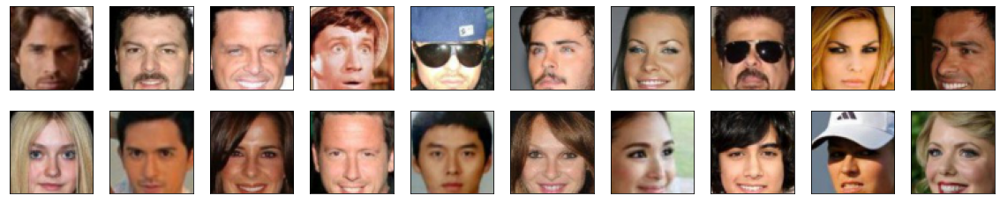

In [10]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [11]:
from torch.nn import Module
from torch import nn

In [12]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
        )

        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        return self.main(x).view(-1, 1)

In [13]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [14]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        self.main = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )


    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        return self.main(x)

In [15]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [16]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    g_optimizer = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [17]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    target_labels = torch.ones_like(fake_logits)
    loss = F.binary_cross_entropy_with_logits(fake_logits, target_labels)
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [18]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    real_loss = nn.functional.binary_cross_entropy_with_logits(real_logits, torch.ones_like(real_logits))
    fake_loss = nn.functional.binary_cross_entropy_with_logits(fake_logits, torch.zeros_like(fake_logits))
    loss = real_loss.mean() + fake_loss.mean()
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [ ]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [19]:
def generator_step(batch_size: int, latent_dim: int, generator: torch.nn.Module, discriminator: torch.nn.Module, g_optimizer: optim.Optimizer) -> Dict:
    """ One training step of the generator. """
    # Generate random latent vectors
    latent_vectors = torch.randn(batch_size, latent_dim, 1, 1)
    
    # Generate fake images
    fake_images = generator(latent_vectors.to(device))
    
    # Pass fake images through the discriminator
    fake_logits = discriminator(fake_images)
    
    # Calculate generator loss
    g_loss = generator_loss(fake_logits)
    
    # Backpropagation
    g_loss.backward()
    
    # Optimizer step
    g_optimizer.step()
    
    # Reset gradients
    generator.zero_grad()
    
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor, generator: torch.nn.Module, discriminator: torch.nn.Module, d_optimizer: optim.Optimizer) -> Dict:
    """ One training step of the discriminator. """
    # Generate random latent vectors
    latent_vectors = torch.randn(batch_size, latent_dim, 1, 1)
    
    # Generate fake images
    fake_images = generator(latent_vectors.to(device)).detach()
    
    # Pass real and fake images through the discriminator
    real_logits = discriminator(real_images)
    fake_logits = discriminator(fake_images)
    
    # Calculate discriminator loss and gradient penalty
    d_loss= discriminator_loss(real_logits, fake_logits)
    
    # Backpropagation
    d_loss.backward()
    
    # Optimizer step
    d_optimizer.step()
    
    # Reset gradients
    discriminator.zero_grad()
    
    return {'loss': d_loss}


### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [20]:
from datetime import datetime

In [24]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 21

# number of images in each batch
batch_size = 64

In [25]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [26]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

In [28]:
import torch.nn.functional as F

2023-06-21 17:11:04 | Epoch [1/21] | Batch 0/509 | d_loss: 1.2512 | g_loss: 0.8215
2023-06-21 17:11:15 | Epoch [1/21] | Batch 50/509 | d_loss: 0.0986 | g_loss: 9.7215
2023-06-21 17:11:26 | Epoch [1/21] | Batch 100/509 | d_loss: 0.2940 | g_loss: 10.1028
2023-06-21 17:11:36 | Epoch [1/21] | Batch 150/509 | d_loss: 1.3633 | g_loss: 6.0474
2023-06-21 17:11:47 | Epoch [1/21] | Batch 200/509 | d_loss: 0.3161 | g_loss: 2.5896
2023-06-21 17:11:57 | Epoch [1/21] | Batch 250/509 | d_loss: 0.0758 | g_loss: 3.4856
2023-06-21 17:12:08 | Epoch [1/21] | Batch 300/509 | d_loss: 0.3159 | g_loss: 2.2322
2023-06-21 17:12:18 | Epoch [1/21] | Batch 350/509 | d_loss: 0.2152 | g_loss: 2.1693
2023-06-21 17:12:29 | Epoch [1/21] | Batch 400/509 | d_loss: 0.3904 | g_loss: 1.6409
2023-06-21 17:12:39 | Epoch [1/21] | Batch 450/509 | d_loss: 0.2342 | g_loss: 5.2266
2023-06-21 17:12:50 | Epoch [1/21] | Batch 500/509 | d_loss: 0.1448 | g_loss: 3.4505


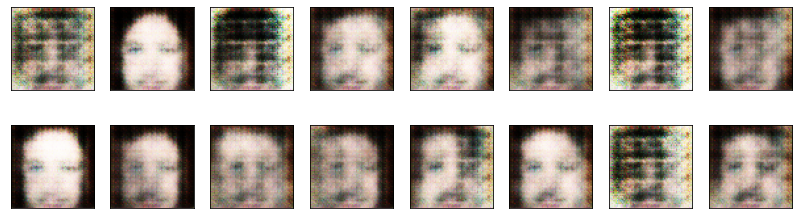

2023-06-21 17:12:53 | Epoch [2/21] | Batch 0/509 | d_loss: 0.2859 | g_loss: 2.4189
2023-06-21 17:13:03 | Epoch [2/21] | Batch 50/509 | d_loss: 0.2582 | g_loss: 2.0100
2023-06-21 17:13:14 | Epoch [2/21] | Batch 100/509 | d_loss: 0.3594 | g_loss: 1.6898
2023-06-21 17:13:24 | Epoch [2/21] | Batch 150/509 | d_loss: 0.2585 | g_loss: 4.6742
2023-06-21 17:13:35 | Epoch [2/21] | Batch 200/509 | d_loss: 0.0591 | g_loss: 5.2521
2023-06-21 17:13:46 | Epoch [2/21] | Batch 250/509 | d_loss: 0.2620 | g_loss: 3.9551
2023-06-21 17:13:56 | Epoch [2/21] | Batch 300/509 | d_loss: 0.2777 | g_loss: 2.8244
2023-06-21 17:14:07 | Epoch [2/21] | Batch 350/509 | d_loss: 0.9766 | g_loss: 0.6637
2023-06-21 17:14:17 | Epoch [2/21] | Batch 400/509 | d_loss: 0.1981 | g_loss: 2.7070
2023-06-21 17:14:28 | Epoch [2/21] | Batch 450/509 | d_loss: 0.4839 | g_loss: 1.4749
2023-06-21 17:14:38 | Epoch [2/21] | Batch 500/509 | d_loss: 0.2788 | g_loss: 2.8900


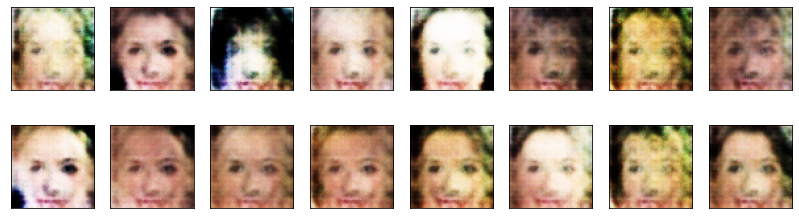

2023-06-21 17:14:41 | Epoch [3/21] | Batch 0/509 | d_loss: 1.2418 | g_loss: 0.5065
2023-06-21 17:14:52 | Epoch [3/21] | Batch 50/509 | d_loss: 0.5134 | g_loss: 9.3535
2023-06-21 17:15:02 | Epoch [3/21] | Batch 100/509 | d_loss: 0.3377 | g_loss: 2.1577
2023-06-21 17:15:13 | Epoch [3/21] | Batch 150/509 | d_loss: 0.2334 | g_loss: 3.1672
2023-06-21 17:15:23 | Epoch [3/21] | Batch 200/509 | d_loss: 0.6941 | g_loss: 1.2470
2023-06-21 17:15:34 | Epoch [3/21] | Batch 250/509 | d_loss: 0.3950 | g_loss: 1.5938
2023-06-21 17:15:44 | Epoch [3/21] | Batch 300/509 | d_loss: 0.2870 | g_loss: 3.8151
2023-06-21 17:15:55 | Epoch [3/21] | Batch 350/509 | d_loss: 0.6304 | g_loss: 6.0708
2023-06-21 17:16:06 | Epoch [3/21] | Batch 400/509 | d_loss: 0.4009 | g_loss: 2.4012
2023-06-21 17:16:16 | Epoch [3/21] | Batch 450/509 | d_loss: 0.6275 | g_loss: 3.3434
2023-06-21 17:16:27 | Epoch [3/21] | Batch 500/509 | d_loss: 0.4485 | g_loss: 1.5709


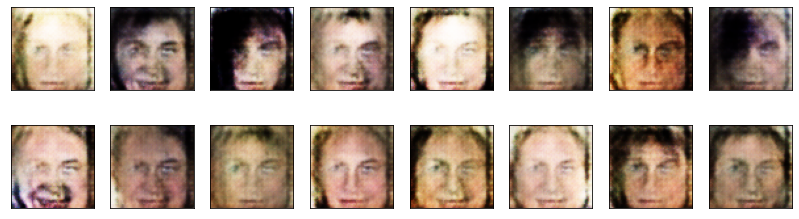

2023-06-21 17:16:30 | Epoch [4/21] | Batch 0/509 | d_loss: 0.3109 | g_loss: 4.1743
2023-06-21 17:16:40 | Epoch [4/21] | Batch 50/509 | d_loss: 0.0519 | g_loss: 4.8196
2023-06-21 17:16:51 | Epoch [4/21] | Batch 100/509 | d_loss: 0.2145 | g_loss: 3.1737
2023-06-21 17:17:01 | Epoch [4/21] | Batch 150/509 | d_loss: 0.3049 | g_loss: 1.9850
2023-06-21 17:17:12 | Epoch [4/21] | Batch 200/509 | d_loss: 0.5384 | g_loss: 6.0894
2023-06-21 17:17:22 | Epoch [4/21] | Batch 250/509 | d_loss: 0.3184 | g_loss: 3.0369
2023-06-21 17:17:33 | Epoch [4/21] | Batch 300/509 | d_loss: 0.1623 | g_loss: 4.1074
2023-06-21 17:17:43 | Epoch [4/21] | Batch 350/509 | d_loss: 0.2137 | g_loss: 4.8298
2023-06-21 17:17:54 | Epoch [4/21] | Batch 400/509 | d_loss: 0.7849 | g_loss: 0.9309
2023-06-21 17:18:04 | Epoch [4/21] | Batch 450/509 | d_loss: 0.4670 | g_loss: 1.3842
2023-06-21 17:18:15 | Epoch [4/21] | Batch 500/509 | d_loss: 0.9199 | g_loss: 0.6687


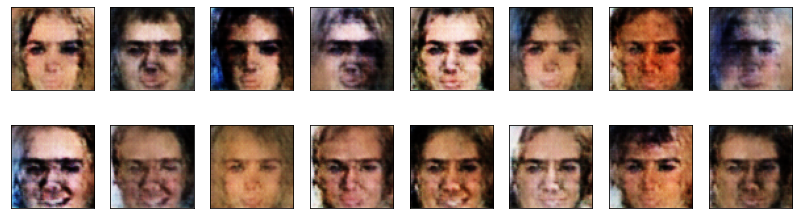

2023-06-21 17:18:18 | Epoch [5/21] | Batch 0/509 | d_loss: 0.4756 | g_loss: 1.8776
2023-06-21 17:18:28 | Epoch [5/21] | Batch 50/509 | d_loss: 0.3152 | g_loss: 1.7062
2023-06-21 17:18:39 | Epoch [5/21] | Batch 100/509 | d_loss: 0.6548 | g_loss: 6.5742
2023-06-21 17:18:50 | Epoch [5/21] | Batch 150/509 | d_loss: 0.3799 | g_loss: 1.8817
2023-06-21 17:19:00 | Epoch [5/21] | Batch 200/509 | d_loss: 0.3250 | g_loss: 1.8941
2023-06-21 17:19:11 | Epoch [5/21] | Batch 250/509 | d_loss: 0.0607 | g_loss: 3.7029
2023-06-21 17:19:21 | Epoch [5/21] | Batch 300/509 | d_loss: 0.2363 | g_loss: 3.5907
2023-06-21 17:19:32 | Epoch [5/21] | Batch 350/509 | d_loss: 2.3850 | g_loss: 10.8896
2023-06-21 17:19:42 | Epoch [5/21] | Batch 400/509 | d_loss: 0.6316 | g_loss: 1.0130
2023-06-21 17:19:53 | Epoch [5/21] | Batch 450/509 | d_loss: 0.3336 | g_loss: 1.8674
2023-06-21 17:20:03 | Epoch [5/21] | Batch 500/509 | d_loss: 0.7274 | g_loss: 7.1571


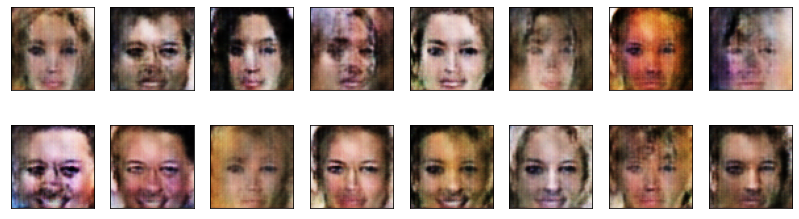

2023-06-21 17:20:06 | Epoch [6/21] | Batch 0/509 | d_loss: 0.5460 | g_loss: 3.7236
2023-06-21 17:20:17 | Epoch [6/21] | Batch 50/509 | d_loss: 0.2614 | g_loss: 2.5881
2023-06-21 17:20:27 | Epoch [6/21] | Batch 100/509 | d_loss: 0.2547 | g_loss: 1.8696
2023-06-21 17:20:38 | Epoch [6/21] | Batch 150/509 | d_loss: 0.1980 | g_loss: 2.8912
2023-06-21 17:20:49 | Epoch [6/21] | Batch 200/509 | d_loss: 1.2392 | g_loss: 0.9493
2023-06-21 17:20:59 | Epoch [6/21] | Batch 250/509 | d_loss: 0.0820 | g_loss: 5.8591
2023-06-21 17:21:10 | Epoch [6/21] | Batch 300/509 | d_loss: 0.3164 | g_loss: 2.2287
2023-06-21 17:21:20 | Epoch [6/21] | Batch 350/509 | d_loss: 0.2062 | g_loss: 4.2519
2023-06-21 17:21:31 | Epoch [6/21] | Batch 400/509 | d_loss: 0.6009 | g_loss: 1.3024
2023-06-21 17:21:41 | Epoch [6/21] | Batch 450/509 | d_loss: 0.1337 | g_loss: 4.3658
2023-06-21 17:21:52 | Epoch [6/21] | Batch 500/509 | d_loss: 0.9079 | g_loss: 0.9021


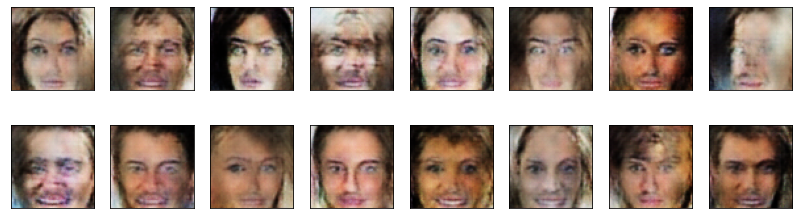

2023-06-21 17:21:55 | Epoch [7/21] | Batch 0/509 | d_loss: 0.9001 | g_loss: 0.8418
2023-06-21 17:22:05 | Epoch [7/21] | Batch 50/509 | d_loss: 0.1238 | g_loss: 2.9339
2023-06-21 17:22:16 | Epoch [7/21] | Batch 100/509 | d_loss: 0.3413 | g_loss: 6.4060
2023-06-21 17:22:27 | Epoch [7/21] | Batch 150/509 | d_loss: 0.3245 | g_loss: 3.4059
2023-06-21 17:22:37 | Epoch [7/21] | Batch 200/509 | d_loss: 0.1110 | g_loss: 4.4787
2023-06-21 17:22:48 | Epoch [7/21] | Batch 250/509 | d_loss: 0.2045 | g_loss: 2.4775
2023-06-21 17:22:58 | Epoch [7/21] | Batch 300/509 | d_loss: 0.5073 | g_loss: 1.4904
2023-06-21 17:23:09 | Epoch [7/21] | Batch 350/509 | d_loss: 0.5613 | g_loss: 1.5753
2023-06-21 17:23:19 | Epoch [7/21] | Batch 400/509 | d_loss: 0.2326 | g_loss: 2.3043
2023-06-21 17:23:30 | Epoch [7/21] | Batch 450/509 | d_loss: 0.1713 | g_loss: 3.0181
2023-06-21 17:23:40 | Epoch [7/21] | Batch 500/509 | d_loss: 0.3003 | g_loss: 4.8897


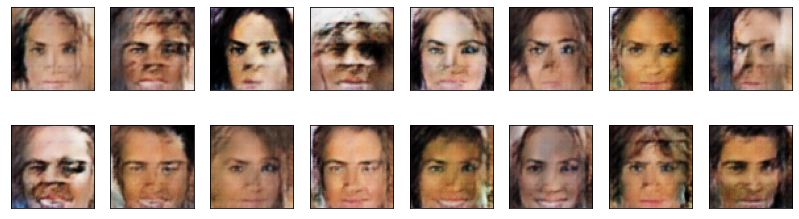

2023-06-21 17:23:43 | Epoch [8/21] | Batch 0/509 | d_loss: 0.4105 | g_loss: 1.6374
2023-06-21 17:23:54 | Epoch [8/21] | Batch 50/509 | d_loss: 0.1847 | g_loss: 2.9450
2023-06-21 17:24:05 | Epoch [8/21] | Batch 100/509 | d_loss: 0.5922 | g_loss: 5.0323
2023-06-21 17:24:15 | Epoch [8/21] | Batch 150/509 | d_loss: 0.2942 | g_loss: 2.4080
2023-06-21 17:24:26 | Epoch [8/21] | Batch 200/509 | d_loss: 0.4434 | g_loss: 4.6517
2023-06-21 17:24:36 | Epoch [8/21] | Batch 250/509 | d_loss: 0.3650 | g_loss: 3.9652
2023-06-21 17:24:47 | Epoch [8/21] | Batch 300/509 | d_loss: 0.2008 | g_loss: 4.9759
2023-06-21 17:24:57 | Epoch [8/21] | Batch 350/509 | d_loss: 0.2248 | g_loss: 3.1566
2023-06-21 17:25:08 | Epoch [8/21] | Batch 400/509 | d_loss: 0.4894 | g_loss: 5.0133
2023-06-21 17:25:18 | Epoch [8/21] | Batch 450/509 | d_loss: 0.1706 | g_loss: 2.8887
2023-06-21 17:25:29 | Epoch [8/21] | Batch 500/509 | d_loss: 0.3973 | g_loss: 2.2955


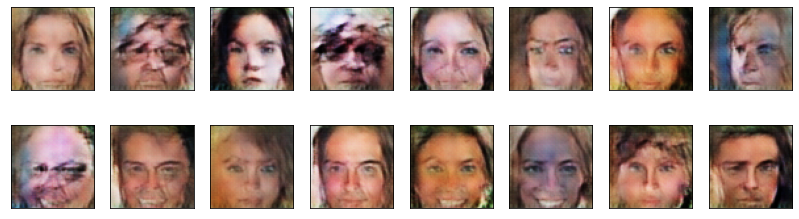

2023-06-21 17:25:32 | Epoch [9/21] | Batch 0/509 | d_loss: 0.1554 | g_loss: 2.6483
2023-06-21 17:25:42 | Epoch [9/21] | Batch 50/509 | d_loss: 0.4755 | g_loss: 2.2234
2023-06-21 17:25:53 | Epoch [9/21] | Batch 100/509 | d_loss: 0.6832 | g_loss: 1.0021
2023-06-21 17:26:03 | Epoch [9/21] | Batch 150/509 | d_loss: 0.1053 | g_loss: 3.4749
2023-06-21 17:26:14 | Epoch [9/21] | Batch 200/509 | d_loss: 0.5117 | g_loss: 1.7287
2023-06-21 17:26:24 | Epoch [9/21] | Batch 250/509 | d_loss: 0.5073 | g_loss: 1.4146
2023-06-21 17:26:35 | Epoch [9/21] | Batch 300/509 | d_loss: 0.0408 | g_loss: 5.6506
2023-06-21 17:26:46 | Epoch [9/21] | Batch 350/509 | d_loss: 0.3974 | g_loss: 1.8839
2023-06-21 17:26:56 | Epoch [9/21] | Batch 400/509 | d_loss: 0.2302 | g_loss: 2.8564
2023-06-21 17:27:07 | Epoch [9/21] | Batch 450/509 | d_loss: 0.0927 | g_loss: 5.7595
2023-06-21 17:27:17 | Epoch [9/21] | Batch 500/509 | d_loss: 0.1870 | g_loss: 3.7922


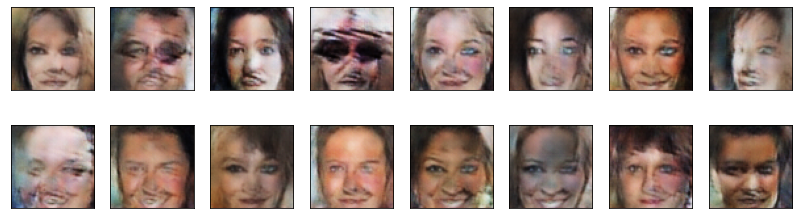

2023-06-21 17:27:20 | Epoch [10/21] | Batch 0/509 | d_loss: 0.2513 | g_loss: 4.3550
2023-06-21 17:27:31 | Epoch [10/21] | Batch 50/509 | d_loss: 0.0810 | g_loss: 5.3071
2023-06-21 17:27:41 | Epoch [10/21] | Batch 100/509 | d_loss: 0.2667 | g_loss: 4.8223
2023-06-21 17:27:52 | Epoch [10/21] | Batch 150/509 | d_loss: 0.3681 | g_loss: 4.4548
2023-06-21 17:28:02 | Epoch [10/21] | Batch 200/509 | d_loss: 0.1312 | g_loss: 4.1525
2023-06-21 17:28:13 | Epoch [10/21] | Batch 250/509 | d_loss: 0.1717 | g_loss: 2.9487
2023-06-21 17:28:23 | Epoch [10/21] | Batch 300/509 | d_loss: 1.3640 | g_loss: 0.4528
2023-06-21 17:28:34 | Epoch [10/21] | Batch 350/509 | d_loss: 0.5679 | g_loss: 4.6560
2023-06-21 17:28:44 | Epoch [10/21] | Batch 400/509 | d_loss: 0.2375 | g_loss: 3.5836
2023-06-21 17:28:55 | Epoch [10/21] | Batch 450/509 | d_loss: 0.1170 | g_loss: 7.4868
2023-06-21 17:29:06 | Epoch [10/21] | Batch 500/509 | d_loss: 0.0449 | g_loss: 4.3911


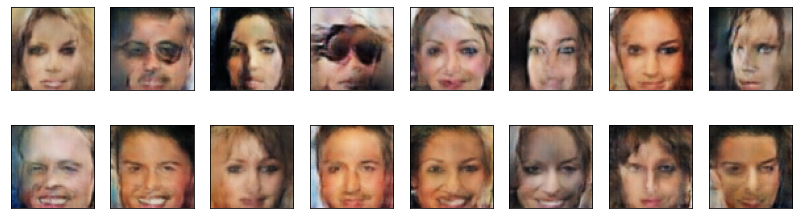

2023-06-21 17:29:08 | Epoch [11/21] | Batch 0/509 | d_loss: 0.0867 | g_loss: 3.0586
2023-06-21 17:29:19 | Epoch [11/21] | Batch 50/509 | d_loss: 0.3937 | g_loss: 1.5899
2023-06-21 17:29:30 | Epoch [11/21] | Batch 100/509 | d_loss: 0.2967 | g_loss: 2.8200
2023-06-21 17:29:40 | Epoch [11/21] | Batch 150/509 | d_loss: 0.1273 | g_loss: 10.2051
2023-06-21 17:29:51 | Epoch [11/21] | Batch 200/509 | d_loss: 0.0532 | g_loss: 5.1807
2023-06-21 17:30:01 | Epoch [11/21] | Batch 250/509 | d_loss: 0.5379 | g_loss: 1.3047
2023-06-21 17:30:12 | Epoch [11/21] | Batch 300/509 | d_loss: 0.0420 | g_loss: 4.5262
2023-06-21 17:30:22 | Epoch [11/21] | Batch 350/509 | d_loss: 0.0361 | g_loss: 4.1538
2023-06-21 17:30:33 | Epoch [11/21] | Batch 400/509 | d_loss: 0.2721 | g_loss: 1.8194
2023-06-21 17:30:43 | Epoch [11/21] | Batch 450/509 | d_loss: 0.2669 | g_loss: 2.2026
2023-06-21 17:30:54 | Epoch [11/21] | Batch 500/509 | d_loss: 0.1754 | g_loss: 2.5755


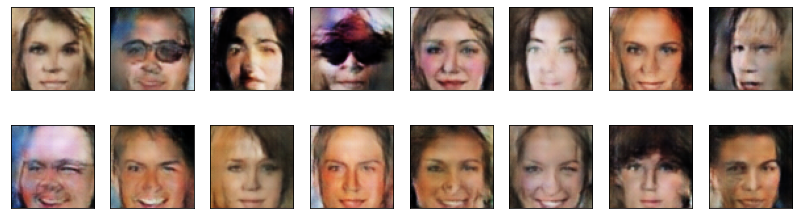

2023-06-21 17:30:57 | Epoch [12/21] | Batch 0/509 | d_loss: 0.1164 | g_loss: 5.3183
2023-06-21 17:31:07 | Epoch [12/21] | Batch 50/509 | d_loss: 0.1180 | g_loss: 3.9031
2023-06-21 17:31:18 | Epoch [12/21] | Batch 100/509 | d_loss: 0.0168 | g_loss: 6.2690
2023-06-21 17:31:28 | Epoch [12/21] | Batch 150/509 | d_loss: 0.0732 | g_loss: 3.3993
2023-06-21 17:31:39 | Epoch [12/21] | Batch 200/509 | d_loss: 0.0627 | g_loss: 4.5473
2023-06-21 17:31:50 | Epoch [12/21] | Batch 250/509 | d_loss: 0.1943 | g_loss: 2.3073
2023-06-21 17:32:00 | Epoch [12/21] | Batch 300/509 | d_loss: 0.1227 | g_loss: 2.8313
2023-06-21 17:32:11 | Epoch [12/21] | Batch 350/509 | d_loss: 0.0152 | g_loss: 7.5049
2023-06-21 17:32:21 | Epoch [12/21] | Batch 400/509 | d_loss: 0.3041 | g_loss: 1.7179
2023-06-21 17:32:32 | Epoch [12/21] | Batch 450/509 | d_loss: 0.0327 | g_loss: 4.8419
2023-06-21 17:32:42 | Epoch [12/21] | Batch 500/509 | d_loss: 0.0675 | g_loss: 3.5813


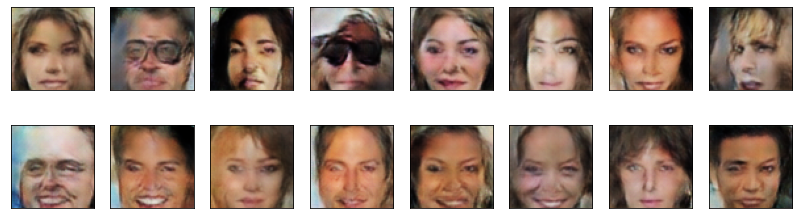

2023-06-21 17:32:45 | Epoch [13/21] | Batch 0/509 | d_loss: 0.7017 | g_loss: 1.0000
2023-06-21 17:32:56 | Epoch [13/21] | Batch 50/509 | d_loss: 0.0907 | g_loss: 6.0950
2023-06-21 17:33:06 | Epoch [13/21] | Batch 100/509 | d_loss: 0.0800 | g_loss: 3.4288
2023-06-21 17:33:17 | Epoch [13/21] | Batch 150/509 | d_loss: 0.0161 | g_loss: 8.4505
2023-06-21 17:33:27 | Epoch [13/21] | Batch 200/509 | d_loss: 0.0062 | g_loss: 8.2771
2023-06-21 17:33:38 | Epoch [13/21] | Batch 250/509 | d_loss: 0.3891 | g_loss: 8.9231
2023-06-21 17:33:48 | Epoch [13/21] | Batch 300/509 | d_loss: 0.1138 | g_loss: 2.9038
2023-06-21 17:33:59 | Epoch [13/21] | Batch 350/509 | d_loss: 0.1426 | g_loss: 12.5365
2023-06-21 17:34:09 | Epoch [13/21] | Batch 400/509 | d_loss: 0.0898 | g_loss: 6.9585
2023-06-21 17:34:20 | Epoch [13/21] | Batch 450/509 | d_loss: 0.3594 | g_loss: 1.7456
2023-06-21 17:34:30 | Epoch [13/21] | Batch 500/509 | d_loss: 0.8420 | g_loss: 7.9544


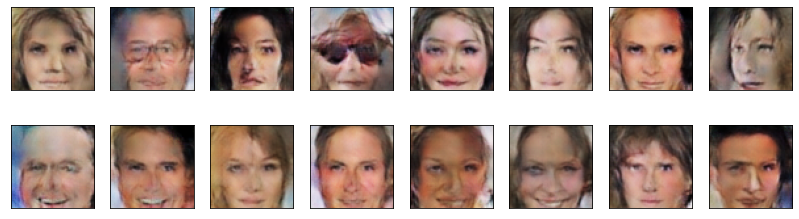

2023-06-21 17:34:33 | Epoch [14/21] | Batch 0/509 | d_loss: 0.0432 | g_loss: 5.1608
2023-06-21 17:34:44 | Epoch [14/21] | Batch 50/509 | d_loss: 0.0437 | g_loss: 4.8649
2023-06-21 17:34:54 | Epoch [14/21] | Batch 100/509 | d_loss: 0.3761 | g_loss: 1.6923
2023-06-21 17:35:05 | Epoch [14/21] | Batch 150/509 | d_loss: 0.0558 | g_loss: 3.6764
2023-06-21 17:35:15 | Epoch [14/21] | Batch 200/509 | d_loss: 0.6573 | g_loss: 6.8139
2023-06-21 17:35:26 | Epoch [14/21] | Batch 250/509 | d_loss: 0.0531 | g_loss: 3.9586
2023-06-21 17:35:37 | Epoch [14/21] | Batch 300/509 | d_loss: 0.0588 | g_loss: 4.6354
2023-06-21 17:35:47 | Epoch [14/21] | Batch 350/509 | d_loss: 0.2137 | g_loss: 5.4879
2023-06-21 17:35:58 | Epoch [14/21] | Batch 400/509 | d_loss: 0.1227 | g_loss: 2.8379
2023-06-21 17:36:08 | Epoch [14/21] | Batch 450/509 | d_loss: 0.0739 | g_loss: 4.6248
2023-06-21 17:36:19 | Epoch [14/21] | Batch 500/509 | d_loss: 0.0753 | g_loss: 3.3545


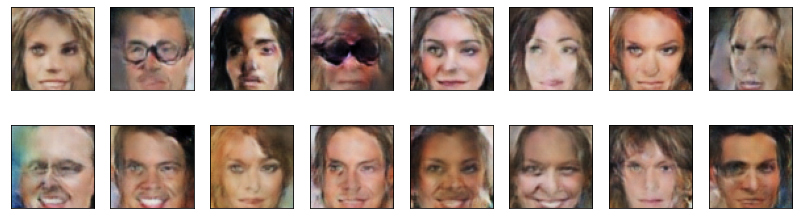

2023-06-21 17:36:22 | Epoch [15/21] | Batch 0/509 | d_loss: 0.4628 | g_loss: 6.5549
2023-06-21 17:36:32 | Epoch [15/21] | Batch 50/509 | d_loss: 0.0502 | g_loss: 4.8073
2023-06-21 17:36:43 | Epoch [15/21] | Batch 100/509 | d_loss: 0.0423 | g_loss: 5.3118
2023-06-21 17:36:53 | Epoch [15/21] | Batch 150/509 | d_loss: 0.0259 | g_loss: 5.1762
2023-06-21 17:37:04 | Epoch [15/21] | Batch 200/509 | d_loss: 0.0203 | g_loss: 6.4498
2023-06-21 17:37:14 | Epoch [15/21] | Batch 250/509 | d_loss: 0.3386 | g_loss: 1.7526
2023-06-21 17:37:25 | Epoch [15/21] | Batch 300/509 | d_loss: 0.0147 | g_loss: 6.8251
2023-06-21 17:37:35 | Epoch [15/21] | Batch 350/509 | d_loss: 0.0696 | g_loss: 4.2173
2023-06-21 17:37:46 | Epoch [15/21] | Batch 400/509 | d_loss: 0.0072 | g_loss: 6.8206
2023-06-21 17:37:56 | Epoch [15/21] | Batch 450/509 | d_loss: 2.2594 | g_loss: 10.2143
2023-06-21 17:38:07 | Epoch [15/21] | Batch 500/509 | d_loss: 0.1385 | g_loss: 6.3717


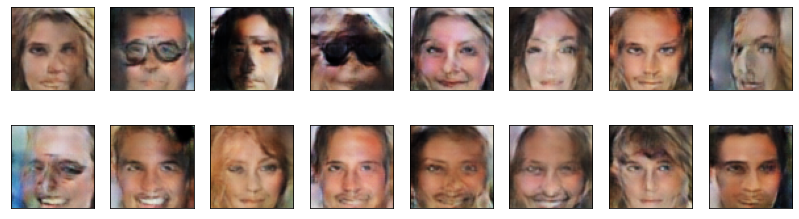

2023-06-21 17:38:10 | Epoch [16/21] | Batch 0/509 | d_loss: 0.0726 | g_loss: 5.9413
2023-06-21 17:38:21 | Epoch [16/21] | Batch 50/509 | d_loss: 1.7319 | g_loss: 8.1031
2023-06-21 17:38:31 | Epoch [16/21] | Batch 100/509 | d_loss: 0.0406 | g_loss: 6.2579
2023-06-21 17:38:42 | Epoch [16/21] | Batch 150/509 | d_loss: 0.2166 | g_loss: 6.2946
2023-06-21 17:38:52 | Epoch [16/21] | Batch 200/509 | d_loss: 0.1453 | g_loss: 3.3559
2023-06-21 17:39:03 | Epoch [16/21] | Batch 250/509 | d_loss: 0.0053 | g_loss: 7.8402
2023-06-21 17:39:13 | Epoch [16/21] | Batch 300/509 | d_loss: 1.2000 | g_loss: 0.7864
2023-06-21 17:39:24 | Epoch [16/21] | Batch 350/509 | d_loss: 0.3620 | g_loss: 7.7827
2023-06-21 17:39:34 | Epoch [16/21] | Batch 400/509 | d_loss: 0.0376 | g_loss: 4.0054
2023-06-21 17:39:45 | Epoch [16/21] | Batch 450/509 | d_loss: 0.0252 | g_loss: 8.2360
2023-06-21 17:39:55 | Epoch [16/21] | Batch 500/509 | d_loss: 0.0126 | g_loss: 6.6615


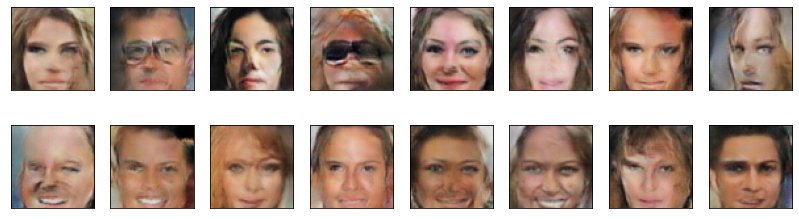

2023-06-21 17:39:58 | Epoch [17/21] | Batch 0/509 | d_loss: 0.4870 | g_loss: 1.3014
2023-06-21 17:40:09 | Epoch [17/21] | Batch 50/509 | d_loss: 0.0562 | g_loss: 8.6732
2023-06-21 17:40:19 | Epoch [17/21] | Batch 100/509 | d_loss: 0.1409 | g_loss: 3.9779
2023-06-21 17:40:30 | Epoch [17/21] | Batch 150/509 | d_loss: 0.0577 | g_loss: 4.9066
2023-06-21 17:40:40 | Epoch [17/21] | Batch 200/509 | d_loss: 0.4401 | g_loss: 1.5211
2023-06-21 17:40:51 | Epoch [17/21] | Batch 250/509 | d_loss: 0.0462 | g_loss: 4.3791
2023-06-21 17:41:02 | Epoch [17/21] | Batch 300/509 | d_loss: 0.2572 | g_loss: 2.1165
2023-06-21 17:41:12 | Epoch [17/21] | Batch 350/509 | d_loss: 0.0752 | g_loss: 5.7322
2023-06-21 17:41:23 | Epoch [17/21] | Batch 400/509 | d_loss: 0.1112 | g_loss: 3.0376
2023-06-21 17:41:33 | Epoch [17/21] | Batch 450/509 | d_loss: 0.0464 | g_loss: 8.4001
2023-06-21 17:41:44 | Epoch [17/21] | Batch 500/509 | d_loss: 0.0244 | g_loss: 4.6581


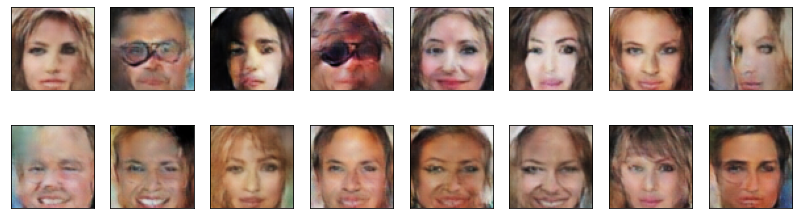

2023-06-21 17:41:47 | Epoch [18/21] | Batch 0/509 | d_loss: 0.2319 | g_loss: 2.1440
2023-06-21 17:41:57 | Epoch [18/21] | Batch 50/509 | d_loss: 0.2762 | g_loss: 2.9396
2023-06-21 17:42:08 | Epoch [18/21] | Batch 100/509 | d_loss: 0.2323 | g_loss: 5.3000
2023-06-21 17:42:18 | Epoch [18/21] | Batch 150/509 | d_loss: 0.2875 | g_loss: 5.0438
2023-06-21 17:42:29 | Epoch [18/21] | Batch 200/509 | d_loss: 0.1187 | g_loss: 5.1678
2023-06-21 17:42:39 | Epoch [18/21] | Batch 250/509 | d_loss: 0.0228 | g_loss: 4.8632
2023-06-21 17:42:50 | Epoch [18/21] | Batch 300/509 | d_loss: 0.1222 | g_loss: 4.5046
2023-06-21 17:43:00 | Epoch [18/21] | Batch 350/509 | d_loss: 0.0117 | g_loss: 6.2606
2023-06-21 17:43:11 | Epoch [18/21] | Batch 400/509 | d_loss: 0.0260 | g_loss: 6.1639
2023-06-21 17:43:21 | Epoch [18/21] | Batch 450/509 | d_loss: 0.1031 | g_loss: 3.3021
2023-06-21 17:43:32 | Epoch [18/21] | Batch 500/509 | d_loss: 0.0796 | g_loss: 3.4886


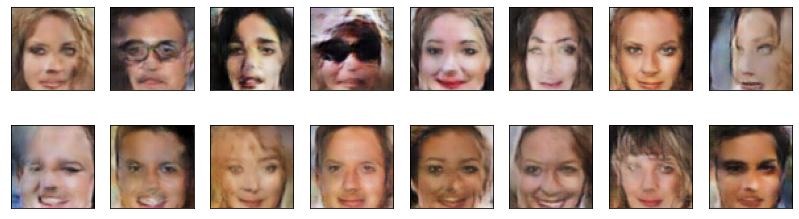

2023-06-21 17:43:35 | Epoch [19/21] | Batch 0/509 | d_loss: 0.8137 | g_loss: 0.9910
2023-06-21 17:43:45 | Epoch [19/21] | Batch 50/509 | d_loss: 0.0123 | g_loss: 5.5717
2023-06-21 17:43:56 | Epoch [19/21] | Batch 100/509 | d_loss: 0.0201 | g_loss: 4.9193
2023-06-21 17:44:06 | Epoch [19/21] | Batch 150/509 | d_loss: 0.0091 | g_loss: 9.0254
2023-06-21 17:44:17 | Epoch [19/21] | Batch 200/509 | d_loss: 0.0432 | g_loss: 5.1820
2023-06-21 17:44:27 | Epoch [19/21] | Batch 250/509 | d_loss: 0.1656 | g_loss: 2.3981
2023-06-21 17:44:38 | Epoch [19/21] | Batch 300/509 | d_loss: 0.1378 | g_loss: 3.7949
2023-06-21 17:44:48 | Epoch [19/21] | Batch 350/509 | d_loss: 0.0052 | g_loss: 7.3755
2023-06-21 17:44:59 | Epoch [19/21] | Batch 400/509 | d_loss: 0.0206 | g_loss: 5.7779
2023-06-21 17:45:09 | Epoch [19/21] | Batch 450/509 | d_loss: 0.0425 | g_loss: 3.8873
2023-06-21 17:45:20 | Epoch [19/21] | Batch 500/509 | d_loss: 0.0710 | g_loss: 3.4105


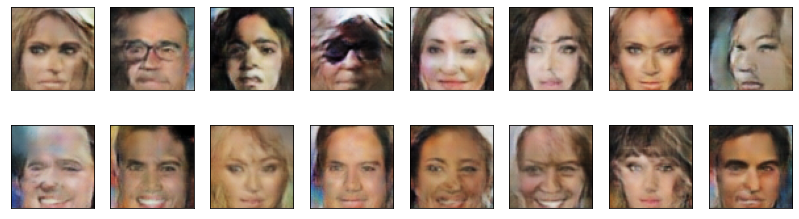

2023-06-21 17:45:23 | Epoch [20/21] | Batch 0/509 | d_loss: 0.0536 | g_loss: 4.2717
2023-06-21 17:45:33 | Epoch [20/21] | Batch 50/509 | d_loss: 0.0668 | g_loss: 6.8791
2023-06-21 17:45:44 | Epoch [20/21] | Batch 100/509 | d_loss: 0.1130 | g_loss: 3.3046
2023-06-21 17:45:54 | Epoch [20/21] | Batch 150/509 | d_loss: 0.0092 | g_loss: 9.5383
2023-06-21 17:46:05 | Epoch [20/21] | Batch 200/509 | d_loss: 0.0072 | g_loss: 6.7713
2023-06-21 17:46:15 | Epoch [20/21] | Batch 250/509 | d_loss: 0.0136 | g_loss: 6.9761
2023-06-21 17:46:26 | Epoch [20/21] | Batch 300/509 | d_loss: 0.0544 | g_loss: 3.7503
2023-06-21 17:46:36 | Epoch [20/21] | Batch 350/509 | d_loss: 0.0281 | g_loss: 5.5038
2023-06-21 17:46:47 | Epoch [20/21] | Batch 400/509 | d_loss: 0.0377 | g_loss: 5.0157
2023-06-21 17:46:57 | Epoch [20/21] | Batch 450/509 | d_loss: 0.0389 | g_loss: 4.7365
2023-06-21 17:47:08 | Epoch [20/21] | Batch 500/509 | d_loss: 0.0678 | g_loss: 7.7081


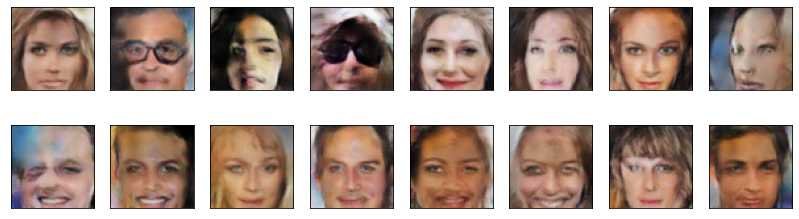

2023-06-21 17:47:11 | Epoch [21/21] | Batch 0/509 | d_loss: 0.0456 | g_loss: 4.7736
2023-06-21 17:47:22 | Epoch [21/21] | Batch 50/509 | d_loss: 0.0130 | g_loss: 5.6650
2023-06-21 17:47:32 | Epoch [21/21] | Batch 100/509 | d_loss: 0.0157 | g_loss: 10.2320
2023-06-21 17:47:43 | Epoch [21/21] | Batch 150/509 | d_loss: 0.0534 | g_loss: 3.6039
2023-06-21 17:47:53 | Epoch [21/21] | Batch 200/509 | d_loss: 0.0092 | g_loss: 8.0363
2023-06-21 17:48:04 | Epoch [21/21] | Batch 250/509 | d_loss: 0.0241 | g_loss: 8.2773
2023-06-21 17:48:14 | Epoch [21/21] | Batch 300/509 | d_loss: 0.0392 | g_loss: 4.2972
2023-06-21 17:48:25 | Epoch [21/21] | Batch 350/509 | d_loss: 0.3296 | g_loss: 7.3205
2023-06-21 17:48:35 | Epoch [21/21] | Batch 400/509 | d_loss: 5.9311 | g_loss: 15.8915
2023-06-21 17:48:46 | Epoch [21/21] | Batch 450/509 | d_loss: 0.5549 | g_loss: 4.3211
2023-06-21 17:48:56 | Epoch [21/21] | Batch 500/509 | d_loss: 0.1458 | g_loss: 6.2020


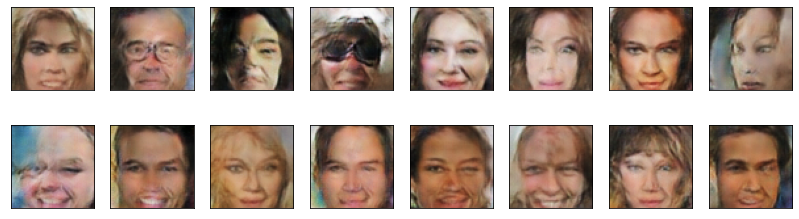

In [29]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        # Training the Generator
        ####################################
        
        # Generate fake images
        fake_images = generator(torch.randn(real_images.size(0), latent_dim, 1, 1).to(device))
        
        # Pass fake images through discriminator
        fake_logits = discriminator(fake_images)
        
        # Calculate generator loss
        g_loss = generator_loss(fake_logits)
        
        # Perform backward pass and optimizer step for the generator
        g_optimizer.zero_grad()
        g_loss.backward()
        g_optimizer.step()
        
        ####################################
        # Training the Discriminator
        ####################################
        
        # Pass real and fake images through discriminator
        real_logits = discriminator(real_images)
        fake_logits = discriminator(fake_images.detach())  # Detach fake_images to avoid backpropagating through the generator
        
        # Calculate discriminator loss
        d_loss = discriminator_loss(real_logits, fake_logits)
        
        # Perform backward pass and optimizer step for the discriminator
        d_optimizer.zero_grad()
        d_loss.backward()
        d_optimizer.step()
        
        ####################################

        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss.item()
            g = g_loss.item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

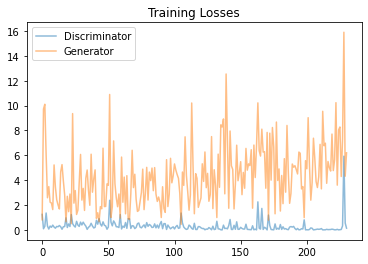

In [30]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** To improve the model, the following steps can be taken:
Dataset diversity: Augmenting the dataset with more diverse facial images can help address the bias and improve the diversity of generated samples. Including images of individuals from various ethnicities and backgrounds can enhance the model's ability to generate a broader range of realistic faces.
Increase model capacity: Consider using a larger model architecture, such as deeper or wider networks, to provide the model with more capacity to learn complex features and details. Models with more parameters have a higher potential for capturing intricate variations and generating higher-quality samples.
Hyperparameter tuning: Experiment with different optimization strategies, including learning rates, optimizers (e.g., Adam, RMSprop), and regularization techniques (e.g., weight decay, dropout). Adjusting these hyperparameters can improve the convergence and overall performance of the model. Additionally, fine-tuning the ratio of generator and discriminator updates or applying other training strategies (e.g., progressive growing) can also enhance the generated samples.
Loss function modifications: Explore alternative loss functions or modifications to existing ones. For example, incorporating perceptual loss or adversarial loss variants like WGAN-GP or LSGAN can lead to improved image quality and stability during training.


### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.